In [3]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

# Άνοιγμα του Ukraine_Doc

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [6]:
Uk_df =pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/ukraine.tsv", sep='\t')
Uk_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,3,14:34,2022-07-03 14:34:00
1,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,3,13:41,2022-07-03 13:41:00
2,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,3,13:32,2022-07-03 13:32:00
3,3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,2,20:54,2022-07-02 20:54:00
4,4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,2,19:29,2022-07-02 19:29:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,08 Μαρτίου 2022 08:29,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,08:29,2022-03-08 08:29:00
1356,1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",08 Μαρτίου 2022 06:56,https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,06:56,2022-03-08 06:56:00
1357,1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,08 Μαρτίου 2022 06:39,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,06:39,2022-03-08 06:39:00
1358,1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,08 Μαρτίου 2022 06:04,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,2022,Μαρτίου,8,06:04,2022-03-08 06:04:00


In [7]:
Uk = Uk_df[['Title', 'URL', 'text', 'About_text', 'created_at', 'Month', 'Day', 'Time', 'Date']]
Uk

,Title,URL,text,About_text,created_at,Month,Day,Time,Date
0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,03 Ιουλίου 2022 14:34,Ιουλίου,3,14:34,2022-07-03 14:34:00
1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,3,13:41,2022-07-03 13:41:00
2,Στην Ελβετία ο Ν. Δένδιας,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,03 Ιουλίου 2022 13:32,Ιουλίου,3,13:32,2022-07-03 13:32:00
3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,2,20:54,2022-07-02 20:54:00
4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,2,19:29,2022-07-02 19:29:00
...,...,...,...,...,...,...,...,...,...
1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 08:29,Μαρτίου,8,08:29,2022-03-08 08:29:00
1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:56,Μαρτίου,8,06:56,2022-03-08 06:56:00
1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:39,Μαρτίου,8,06:39,2022-03-08 06:39:00
1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,08 Μαρτίου 2022 06:04,Μαρτίου,8,06:04,2022-03-08 06:04:00


In [8]:
#Uk.dtypes

In [9]:
Uk['Year'] = Uk.created_at.apply(lambda dt: dt.split(' ')[2])
Uk['Month'] = Uk.created_at.apply(lambda dt: dt.split(' ')[1])
Uk['Day'] = Uk.created_at.apply(lambda dt: dt.split(' ')[0])
Uk['Time'] = Uk.created_at.apply(lambda dt: dt.split(' ')[3])

months = {
    'Ιανουαρίου' : '01',
    'Φεβρουαρίου' : '02', 
    'Μαρτίου' : '03',
    'Απριλίου' : '04',
    'Μαΐου' : '05',
    'Ιουνίου': '06',
    'Ιουλίου' : '07',
    'Αυγούστου' : '08',
    'Σεπτεμβρίου' : '09',
    'Οκτωβρίου' : '10',
    'Νοεμβρίου' : '11',
    'Δεκεμβρίου' : '12',
     
}

Uk['Date'] = Uk.apply(lambda row: f'{months[row.Month]}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
Uk['Date'] = pd.to_datetime(Uk['Date'])


Uk

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,Title,URL,text,About_text,created_at,Month,Day,Time,Date,Year
0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,03 Ιουλίου 2022 14:34,Ιουλίου,03,14:34,2022-07-03 14:34:00,2022
1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
2,Στην Ελβετία ο Ν. Δένδιας,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,03 Ιουλίου 2022 13:32,Ιουλίου,03,13:32,2022-07-03 13:32:00,2022
3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,02,20:54,2022-07-02 20:54:00,2022
4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
...,...,...,...,...,...,...,...,...,...,...
1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 08:29,Μαρτίου,08,08:29,2022-03-08 08:29:00,2022
1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:56,Μαρτίου,08,06:56,2022-03-08 06:56:00,2022
1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:39,Μαρτίου,08,06:39,2022-03-08 06:39:00,2022
1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,08 Μαρτίου 2022 06:04,Μαρτίου,08,06:04,2022-03-08 06:04:00,2022


In [10]:
#Uk.dtypes

In [11]:
Uk = Uk.rename(columns= {'About_text': 'Keywords'})
Uk

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,03 Ιουλίου 2022 14:34,Ιουλίου,03,14:34,2022-07-03 14:34:00,2022
1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
2,Στην Ελβετία ο Ν. Δένδιας,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,03 Ιουλίου 2022 13:32,Ιουλίου,03,13:32,2022-07-03 13:32:00,2022
3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,02,20:54,2022-07-02 20:54:00,2022
4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
...,...,...,...,...,...,...,...,...,...,...
1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 08:29,Μαρτίου,08,08:29,2022-03-08 08:29:00,2022
1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:56,Μαρτίου,08,06:56,2022-03-08 06:56:00,2022
1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:39,Μαρτίου,08,06:39,2022-03-08 06:39:00,2022
1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,08 Μαρτίου 2022 06:04,Μαρτίου,08,06:04,2022-03-08 06:04:00,2022


In [12]:
ΠΟΛΕΜΟΣ= Uk[Uk['Keywords']=='ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ']
ΠΟΛΕΜΟΣ

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
5,"Ζελένσκι: ""Το ρωσικό πλήγμα στην Οδησσό ήταν σ...",https://www.news247.gr/kosmos/zelenski-to-rosi...,Ο Ζελένσκι διατείνεται ότι το ρωσικό πυραυλικό...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 08:25,Ιουλίου,02,08:25,2022-07-02 08:25:00,2022
6,Ουκρανία: Οι φιλορώσοι αυτονομιστές στο Ντονέτ...,https://www.news247.gr/kosmos/oykrania-oi-filo...,Σύμφωνα με τον ποινικό κώδικα της αποσχισθείσα...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,01 Ιουλίου 2022 23:27,Ιουλίου,01,23:27,2022-07-01 23:27:00,2022
7,Ουκρανία: Στους 21 οι νεκροί από επίθεση σε πο...,https://www.news247.gr/kosmos/oykrania-stoys-2...,Στο έλεος των βομβαρδισμών η Οδησσός. Δεκάδες ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,01 Ιουλίου 2022 21:50,Ιουλίου,01,21:50,2022-07-01 21:50:00,2022
...,...,...,...,...,...,...,...,...,...,...
1354,Σε αδιανόητα ύψη οι τιμές αερίου και πετρελαίο...,https://www.news247.gr/energia/se-adianoita-yp...,Μείζον πληθωριστικό σοκ για την παγκόσμια οικο...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 08:35,Μαρτίου,08,08:35,2022-03-08 08:35:00,2022
1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 08:29,Μαρτίου,08,08:29,2022-03-08 08:29:00,2022
1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:56,Μαρτίου,08,06:56,2022-03-08 06:56:00,2022
1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,08 Μαρτίου 2022 06:39,Μαρτίου,08,06:39,2022-03-08 06:39:00,2022


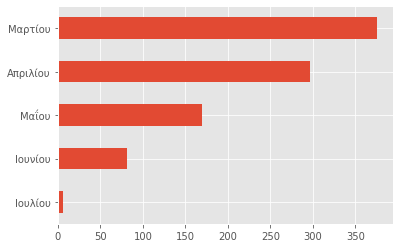

In [13]:
ΠΟΛΕΜΟΣ['Month'].value_counts().head(10).sort_values().plot(kind='barh')

In [14]:
ΡΩΣΙΑ= Uk[Uk['Keywords']=='ΡΩΣΙΑ']
ΡΩΣΙΑ

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
27,"Ζαχάροβα για Ουκρανία και Μολδαβία: ""Δεν σκέφτ...",https://www.news247.gr/kosmos/zacharova-gia-oy...,"Με απειλές και καταγγελίες για ""γεωπολιτική μο...",ΡΩΣΙΑ,24 Ιουνίου 2022 22:57,Ιουνίου,24,22:57,2022-06-24 22:57:00,2022
42,Πεσκόφ: Δεν αποκλείεται θανατική ποινή στους δ...,https://www.news247.gr/kosmos/peskof-den-apokl...,Δεν γνωρίζουμε πού βρίσκονται τώρα οι δύο Αμερ...,ΡΩΣΙΑ,21 Ιουνίου 2022 17:12,Ιουνίου,21,17:12,2022-06-21 17:12:00,2022
48,"Ζαχάροβα: Οι ""καταστροφικές ενέργειες"" της Δύσ...",https://www.news247.gr/kosmos/zacharova-oi-kat...,Εκ νέου κατηγορίες της Μαρίας Ζαχάροβα κατά τη...,ΡΩΣΙΑ,20 Ιουνίου 2022 23:35,Ιουνίου,20,23:35,2022-06-20 23:35:00,2022
53,Μουράτοφ: Ο Ρώσος δημοσιογράφος δημοπρατεί το ...,https://www.news247.gr/kosmos/mpoyratof-o-roso...,Ο Ντμίτρι Μουράτοφ αποδεικνύει στην πράξη του ...,ΡΩΣΙΑ,20 Ιουνίου 2022 09:33,Ιουνίου,20,09:33,2022-06-20 09:33:00,2022
54,"Μαρόκο: Ζητά από τη Ρωσία μια ""δίκαιη δίκη"" γι...",https://www.news247.gr/kosmos/maroko-zita-apo-...,Οι αρχές του Μαρόκο ζητούν από τη Ρωσία να παρ...,ΡΩΣΙΑ,19 Ιουνίου 2022 20:58,Ιουνίου,19,20:58,2022-06-19 20:58:00,2022
...,...,...,...,...,...,...,...,...,...,...
1251,"""Στη Ρωσία υπάρχουν πολλοί άνθρωποι που δεν στ...",https://www.news247.gr/sunday-edition/apo-ti-r...,Εντοπίσαμε Ρωσίδα διαδηλώτρια κατά του πολέμου...,ΡΩΣΙΑ,12 Μαρτίου 2022 09:23,Μαρτίου,12,09:23,2022-03-12 09:23:00,2022
1282,Πόλεμος στην Ουκρανία: Η Μολδαβία ανησυχεί ότι...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Ανησυχία και ανοιχτά ερωτήματα έμειναν μετά τη...,ΡΩΣΙΑ,10 Μαρτίου 2022 17:06,Μαρτίου,10,17:06,2022-03-10 17:06:00,2022
1292,Η Ρωσία αποχωρεί από το Συμβούλιο της Ευρώπης,https://www.news247.gr/kosmos/i-rosia-apochore...,Στην ανακοίνωση ότι δεν θα συμμετέχει πλέον η ...,ΡΩΣΙΑ,10 Μαρτίου 2022 09:38,Μαρτίου,10,09:38,2022-03-10 09:38:00,2022
1320,Έλενα Μπράνσον: Ποια είναι η Ρωσίδα που κατηγο...,https://www.news247.gr/kosmos/elena-mpranson-p...,"Η διπλή υπηκοότητα της Έλενα Μπράνσον, δεν ήτα...",ΡΩΣΙΑ,09 Μαρτίου 2022 10:38,Μαρτίου,09,10:38,2022-03-09 10:38:00,2022


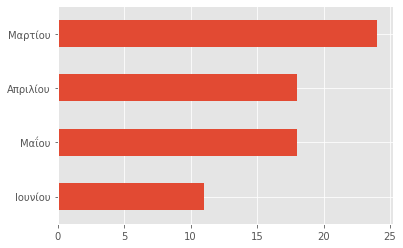

In [15]:
ΡΩΣΙΑ['Month'].value_counts().head(10).sort_values().plot(kind='barh')

In [16]:
Uk['text'] = Uk ['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


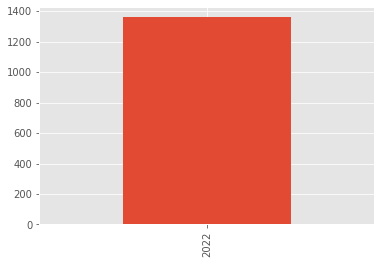

In [17]:
Uk['Year'].value_counts().plot(kind='bar')

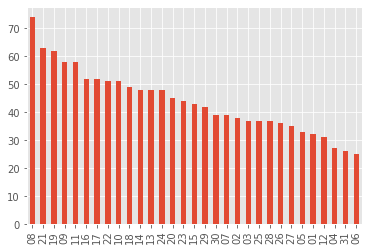

In [18]:
Uk['Day'].value_counts().plot(kind='bar')

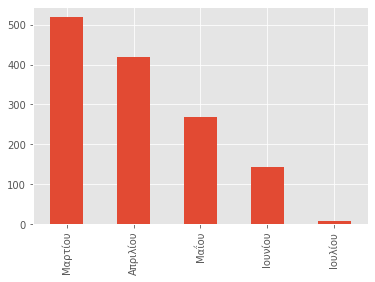

In [19]:

Uk['Month'].value_counts().plot(kind='bar')


In [20]:
Keywords_data = Uk.groupby(['Keywords']).count()['Title'].sort_values(ascending=False)


day_data = Uk.groupby(['Day']).count()['Keywords']
(day_data,Keywords_data)

(Day
 01    32
 02    38
 03    37
 04    27
 05    33
 06    25
 07    39
 08    74
 09    58
 10    51
 11    58
 12    31
 13    48
 14    48
 15    43
 16    52
 17    52
 18    49
 19    62
 20    45
 21    63
 22    51
 23    44
 24    48
 25    37
 26    36
 27    35
 28    37
 29    42
 30    39
 31    26
 Name: Keywords, dtype: int64, Keywords
 ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ       928
 ΡΩΣΙΑ                        71
 ΟΥΚΡΑΝΙΑ                     69
 ΒΟΛΟΝΤΙΜΙΡ ΖΕΛΕΝΣΚΙ          21
 EUROVISION                   19
                            ... 
 ΔΙΕΘΝΗΣ ΠΟΛΙΤΙΚΗ              1
 ΝΙΚΟΣ ΧΡΙΣΤΟΔΟΥΛΑΚΗΣ          1
 ΝΟΝΗ ΔΟΥΝΙΑ                   1
 ΟΙΚΟΝΟΜΙΚΟ ΦΟΡΟΥΜ ΔΕΛΦΩΝ      1
 ΚΡΑΤΙΚΗ ΟΡΧΗΣΤΡΑ ΑΘΗΝΩΝ       1
 Name: Title, Length: 96, dtype: int64)

In [21]:
Keywords_data.head(13)
keywords_data = Keywords_data.head(13)
keywords_data


Keywords
ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ    928
ΡΩΣΙΑ                     71
ΟΥΚΡΑΝΙΑ                  69
ΒΟΛΟΝΤΙΜΙΡ ΖΕΛΕΝΣΚΙ       21
EUROVISION                19
ΝΑΤΟ                      13
ΓΕΡΜΑΝΙΑ                  12
ΣΥ.ΡΙΖ.Α.                 10
ΕΥΡΩΠΑΪΚΗ ΕΝΩΣΗ           10
ΗΠΑ                       10
ΚΥΡΙΑΚΟΣ ΜΗΤΣΟΤΑΚΗΣ       10
ΠΟΥΤΙΝ                     9
ΤΟΥΡΚΙΑ                    8
Name: Title, dtype: int64

In [22]:
day_data.head(31)
Day_data = day_data.head(31)
Day_data


Day
01    32
02    38
03    37
04    27
05    33
06    25
07    39
08    74
09    58
10    51
11    58
12    31
13    48
14    48
15    43
16    52
17    52
18    49
19    62
20    45
21    63
22    51
23    44
24    48
25    37
26    36
27    35
28    37
29    42
30    39
31    26
Name: Keywords, dtype: int64

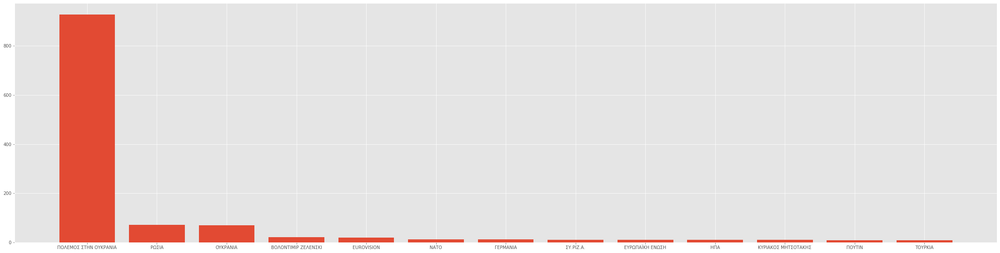

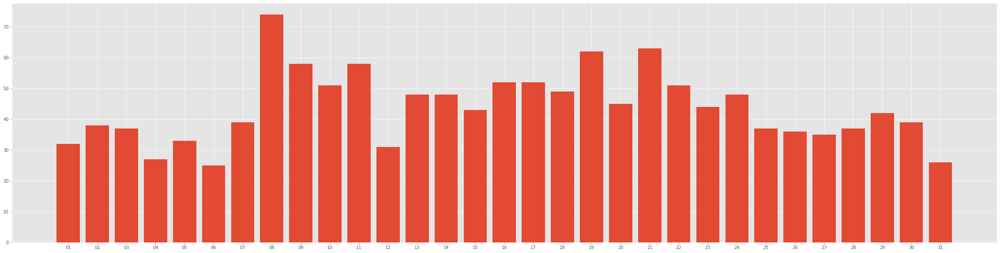

In [23]:
plt.figure(figsize=(40,10))
plt.bar(keywords_data.keys(),keywords_data,)
plt.show()

plt.figure(figsize=(40,10))
plt.bar(Day_data.keys(),Day_data,)
plt.show()

# Wordcloud Ukraine

In [24]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import WordCloud
from collections import Counter
from nltk.util import ngrams
import spacy
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [25]:
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 5.1 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [26]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['έχετε',
 'κάθε',
 'κατά',
 'οποίους',
 'έγινε',
 'είναι',
 'ανάμεσα',
 'μεμιάς',
 'ναι',
 'συχνών',
 'κάμποσης',
 'όσοι',
 'τελικά',
 'στην',
 'μπρος',
 'όλων',
 'έτερες',
 'προχτές',
 'καθενός',
 'λιγότερο']

In [27]:
list(STOPWORDS)[0:20]

['however',
 'him',
 "when's",
 'is',
 'once',
 'who',
 "i'm",
 "you've",
 'into',
 "didn't",
 'get',
 'both',
 "they're",
 'www',
 'does',
 'against',
 "shan't",
 'these',
 'through',
 'its']

In [28]:
text = Uk['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβει την επιτήρηση του εναερίου χώρου της Σλοβακίας "Έπεσε" από τις ρωσικές δυνάμεις η πόλη Λισιτσάνσκ, ενώ το Κίεβο παραδέχθηκε τα κέρδη των Ρώσων στην πόλη Σημαντικό χτύπημα στη Μελιτόπολη, χωρίς ωστόσο να υπάρχουν θύματαΣτην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠΕΞ για να πάρει μέρος στο δείπνο εργασίας των επικεφαλής των αντιπροσωπειών που συμμετέχουν στη Διάσκεψη για την Ανασυγκρότηση της ΟυκρανίαςΟ Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκρανία εξαπέλυσε πυραυλικά πλήγματα εναντίον στρατιωτικών εγκαταστάσεων "Μας προκαλούν", τονίζειΤο Λισίτσανσκ της ανατολικής Ουκρανίας είναι πλέον ένα από τα επίκεντρα του πολέμου στην Ουκρανία που εξακολουθεί να μαίνεται Ο Ζελένσκι διατείνεται ότι το ρωσικό πυραυλικό πλήγμα σε πολυκατοικία στην περιφέρεια της Οδησσού, που είχε ως αποτέλεσμα να σκοτωθούν τουλάχιστον 21 άνθρωποι, δεν ήταν ατύχημα, αλλά μια στοχευμένη επίθεση κατά αμάχωνΣύμφωνα με τον ποινικό κώδικα της αποσχισθείσας Λαϊκής Δημοκρατίας

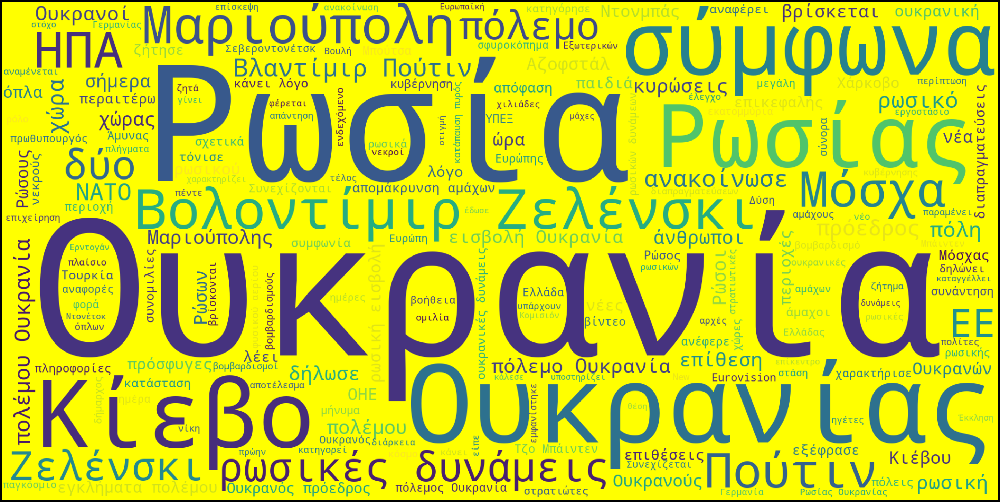

In [29]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'yellow'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

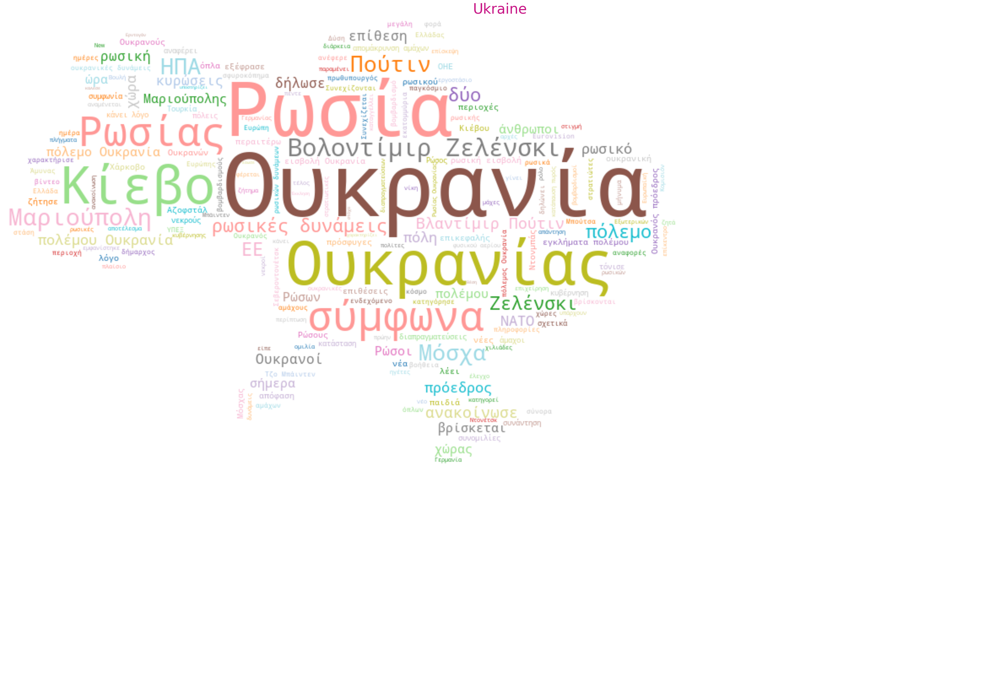

In [30]:
from PIL import Image
import numpy as np
mask = np.array(Image.open("/content/gdrive/MyDrive/Colab Notebooks/Ukraine1.jpg")) #Λογικά θα έχεις κάνει από πριν mount στο drive. Αν όχι κάνε και αυτό για να τραβήξει τη μάσκα.

def generate_name_wordcloud(data, title, mask=mask):
  wordcloud_name = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    scale=1,
    max_words=200,
    colormap='tab20',#Μπες εδώ και διάλεξε colourmap https://matplotlib.org/3.5.0/tutorials/colors/colormaps.html
    mask=mask,
    background_color='white',
    collocations=True).generate(text)#Το όνομα του text που θες να κάνεις word cloud
  plt.figure(figsize = (40, 30))#Αυτό ρύθμισέ το και ανάλογα με την εικόνα. Φρόντισε γενικά να έχεις μεγάλες εικόνες για να είναι ευανάγνωστες οι λέξεις. Οι μικρές αν τις κάνεις ζουμ κάνουν πίξελ και οι λέξεις δεν φαίνονται καλά.
  plt.imshow(wordcloud_name, interpolation = 'bilinear')
  plt.axis('off')
  plt.tight_layout(pad=2)
  plt.title("Ukraine", size= 40, color='mediumvioletred')
  plt.savefig("name.png", format="png") #Δεν έχω καταλάβει πού το κάνει save.
  plt.show()
  
generate_name_wordcloud(text, '' , mask=mask)

In [31]:
word_count = Counter(" ".join(Uk["text"]).split())
word_count = {word.lower() : count for word, count in word_count.items() if not word.lower() in STOPWORDS}
word_count = pd.DataFrame(data={
    'word': word_count.keys(),
    'count': word_count.values()
})

word_count.sort_values('count',ascending=False).head(15)

,word,count
13,της,955
27,των,359
5,η,220
44,ο,198
64,ουκρανία,189
135,ρωσία,122
287,ουκρανία.,116
142,"ουκρανία,",109
109,σύμφωνα,94
76,ουκρανίας,91


In [32]:
from collections import Counter
Counter(" ".join(Uk["text"]).split()).most_common(50)

[('της', 955),
 ('του', 791),
 ('και', 710),
 ('την', 655),
 ('για', 628),
 ('να', 562),
 ('στην', 541),
 ('από', 526),
 ('το', 508),
 ('με', 485),
 ('ο', 454),
 ('η', 449),
 ('τη', 397),
 ('τον', 378),
 ('των', 359),
 ('που', 335),
 ('στο', 332),
 ('οι', 300),
 ('σε', 291),
 ('τις', 242),
 ('στη', 241),
 ('Η', 220),
 ('Ο', 198),
 ('τους', 194),
 ('Ουκρανία', 189),
 ('τα', 187),
 ('θα', 175),
 ('ότι', 166),
 ('Ρωσία', 122),
 ('είναι', 118),
 ('Ουκρανία.', 116),
 ('Ουκρανία,', 109),
 ('δεν', 97),
 ('Οι', 97),
 ('στον', 94),
 ('σύμφωνα', 94),
 ('Ουκρανίας', 91),
 ('μετά', 90),
 ('Ζελένσκι', 89),
 ('πως', 89),
 ('Βολοντίμιρ', 89),
 ('Το', 88),
 ('έχει', 87),
 ('κατά', 81),
 ('στις', 81),
 ('Ρωσίας', 77),
 ('στα', 77),
 ('Πούτιν', 76),
 ('πρόεδρος', 75),
 ('πολέμου', 70)]

In [33]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

έχετε


In [34]:
Uk['text_no_stopwords'] = Uk['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Uk['text_no_stopwords'] = Uk['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Uk['clean_text_no_stopwords'] = Uk['text']
#for stopword in nlp.Defaults.stop_words:
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [35]:
freq = Counter(" ".join(Uk["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('Ουκρανία', 414),
 ('Η', 220),
 ('Ο', 198),
 ('Ρωσία', 191),
 ('Ουκρανίας', 160),
 ('Ζελένσκι', 145),
 ('Ρωσίας', 121),
 ('Πούτιν', 121),
 ('Κίεβο', 109),
 ('πολέμου', 106),
 ('Μαριούπολη', 100),
 ('Οι', 97),
 ('σύμφωνα', 94),
 ('Βολοντίμιρ', 89),
 ('Το', 88),
 ('πρόεδρος', 82)]

In [36]:
import numpy as np


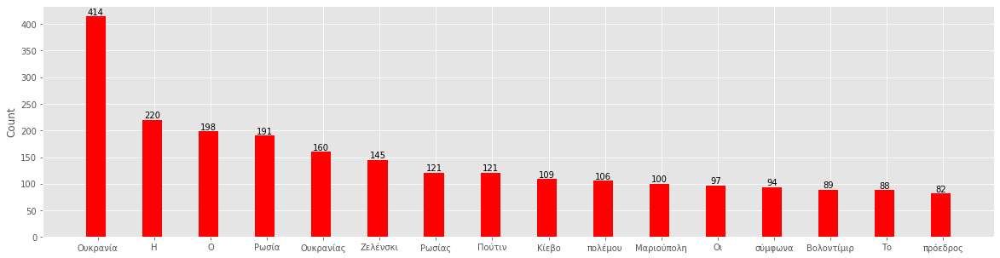

In [37]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

In [38]:
Uk.resample(rule='D',on='Date').count()

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year,text_no_stopwords,clean_text_no_stopwords
Date,,,,,,,,,,,,
2022-03-08,31,31,31,31,31,31,31,31,31,31,31,31
2022-03-09,29,29,29,29,29,29,29,29,29,29,29,29
2022-03-10,24,24,24,24,24,24,24,24,24,24,24,24
2022-03-11,23,23,23,23,23,23,23,23,23,23,23,23
2022-03-12,8,8,8,8,8,8,8,8,8,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-29,4,4,4,4,4,4,4,4,4,4,4,4
2022-06-30,3,3,3,3,3,3,3,3,3,3,3,3
2022-07-01,3,3,3,3,3,3,3,3,3,3,3,3


# Vectorizing Ukraine

In [39]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [40]:
count_vector = cv.fit_transform(Uk['text'])

In [41]:
count_vector.shape

(1360, 6824)

In [42]:
cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,03,05,09,10,100,1000,100ή,100η,...,ύπατος,ύστατη,ύφεσης,ύψος,ύψους,ύψωσαν,ώθηση,ώρα,ώρες,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
#cv.vocabulary_

In [44]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [45]:
count_vector = cv.fit_transform(Uk['text'])

In [46]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,100,eurovision,άμαχοι,άμυνας,άνθρωποι,έδωσε,έκκληση,έλεγχο,ένωση,...,φυσικού,χάρκοβο,χαρακτήρισε,χρήση,χώρα,χώρας,χώρες,όπλα,όπλων,ώρα
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [48]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,eurovision,ΗΠΑ,Κίεβο,ΟΗΕ,Ρωσία,άμαχος,άμυνα,άνθρωπος,έκκληση,έλεγχος,...,φτάνω,φυσικός,χάνω,χάρκοβο,χαρακτηρίζω,χιλιάδα,χρήση,χώρα,όπλο,ώρα
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [49]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,βολοντίμιρ,δυνάμεις,δύο,εισβολή,ζελένσκι,ηπα,κίεβο,μαριούπολη,μόσχα,ουκρανία,ουκρανίας,πολέμου,πούτιν,πρόεδρος,πόλεμο,ρωσία,ρωσίας,ρωσικές,ρωσική,σύμφωνα
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0


In [50]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\bουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκρανές,ουκρανή,ουκρανία,ουκρανίας,ουκρανικά,ουκρανικές,ουκρανική,ουκρανικής,ουκρανικού,ουκρανικό,ουκρανικός,ουκρανικών,ουκρανοί,ουκρανού,ουκρανούς,ουκρανό,ουκρανός,ουκρανών
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [51]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) #token_pattern = '\\bουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,απομάκρυνση αμάχων,βλαντίμιρ πούτιν,βολοντίμιρ ζελένσκι,εγκλήματα πολέμου,εισβολή ουκρανία,κάνει λόγο,κατάπαυση πυρός,ουκρανικές δυνάμεις,ουκρανός πρόεδρος,πολέμου ουκρανία,πόλεμο ουκρανία,πόλεμος ουκρανία,ρωσίας ουκρανίας,ρωσικές δυνάμεις,ρωσική εισβολή,ρωσικής εισβολής,ρωσικών δυνάμεων,τζο μπάιντεν,υπουργός εξωτερικών,φυσικού αερίου
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [52]:
results.sum(axis =0).sort_values(ascending = False)


βολοντίμιρ ζελένσκι    87
ρωσικές δυνάμεις       51
βλαντίμιρ πούτιν       49
πολέμου ουκρανία       41
πόλεμο ουκρανία        36
εισβολή ουκρανία       30
ρωσική εισβολή         29
εγκλήματα πολέμου      24
ουκρανός πρόεδρος      22
απομάκρυνση αμάχων     20
κάνει λόγο             19
ουκρανικές δυνάμεις    18
πόλεμος ουκρανία       18
τζο μπάιντεν           18
κατάπαυση πυρός        17
ρωσικών δυνάμεων       16
φυσικού αερίου         15
ρωσίας ουκρανίας       14
ρωσικής εισβολής       13
υπουργός εξωτερικών    13
dtype: int64

In [53]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()

βολοντίμιρ ζελένσκι    87
ρωσικές δυνάμεις       51
βλαντίμιρ πούτιν       49
πολέμου ουκρανία       41
πόλεμο ουκρανία        36
dtype: int64

In [54]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bουκ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\buk[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ukraine
0,0
1,0
2,0
3,0
4,0


In [55]:
results.sum(axis =0).sort_values(ascending = False)

ukraine    2
dtype: int64

In [56]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['ουκρανια', 'ρωσια', 'πολεμος']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Uk['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκρανια,ρωσια,πολεμος
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [57]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [58]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Uk['text'])  #finds the tfidf score with normalization

In [59]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,100,15,20,200,2022,24,27,azovstal,eurovision,...,χρόνια,χώρα,χώρας,χώρες,όλαφ,όπλα,όπλων,ύψους,ώρα,ώρες
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [60]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[1. 0. 0. ... 0. 0. 0.]]


In [61]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[1.         0.         0.         ... 0.         0.         0.        ]
 [0.         1.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.         0.        ]
 [0.         0.         0.         ... 0.         1.         0.20817302]
 [0.         0.         0.         ... 0.         0.20817302 1.        ]]


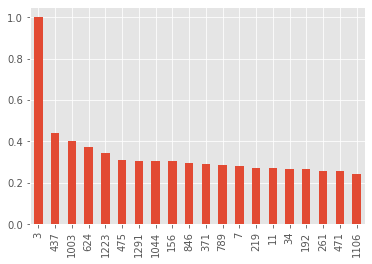

In [62]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [63]:
Uk['text'].loc[3]

'Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκρανία εξαπέλυσε πυραυλικά πλήγματα εναντίον στρατιωτικών εγκαταστάσεων. "Μας προκαλούν", τονίζει.'

In [64]:
Uk['text'].loc[253]

' Δεκάδες εκατομμύρια άνθρωποι οδηγούνται στην επισιτιστική ανασφάλεια που ακολουθείται από υποσιτισμό, μαζική πείνα και λιμό. 30% πάνω οι παγκόσμιες τιμές των τροφίμων σε σχέση με πέρυσι.'

# Emolex Ukraine

In [65]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)
emolex_df

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [67]:
Uk_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/ukraine.tsv", sep='\t')
Uk_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,3,14:34,2022-07-03 14:34:00
1,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,3,13:41,2022-07-03 13:41:00
2,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,3,13:32,2022-07-03 13:32:00
3,3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,2,20:54,2022-07-02 20:54:00
4,4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,2,19:29,2022-07-02 19:29:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,08 Μαρτίου 2022 08:29,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,08:29,2022-03-08 08:29:00
1356,1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",08 Μαρτίου 2022 06:56,https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,06:56,2022-03-08 06:56:00
1357,1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,08 Μαρτίου 2022 06:39,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,8,06:39,2022-03-08 06:39:00
1358,1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,08 Μαρτίου 2022 06:04,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,2022,Μαρτίου,8,06:04,2022-03-08 06:04:00


In [68]:
#Uk_df.dtypes

In [69]:
Uk_df['Year'] = Uk_df.created_at.apply(lambda dt: dt.split(' ')[2])
Uk_df['Month'] = Uk_df.created_at.apply(lambda dt: dt.split(' ')[1])
Uk_df['Day'] = Uk_df.created_at.apply(lambda dt: dt.split(' ')[0])
Uk_df['Time'] = Uk_df.created_at.apply(lambda dt: dt.split(' ')[3])

months = {
    'Ιανουαρίου' : '01',
    'Φεβρουαρίου' : '02', 
    'Μαρτίου' : '03',
    'Απριλίου' : '04',
    'Μαΐου' : '05',
    'Ιουνίου': '06',
    'Ιουλίου' : '07',
    'Αυγούστου' : '08',
    'Σεπτεμβρίου' : '09',
    'Οκτωβρίου' : '10',
    'Νοεμβρίου' : '11',
    'Δεκεμβρίου' : '12',
     
}

Uk_df['Date'] = Uk_df.apply(lambda row: f'{months[row.Month]}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
Uk_df['Date'] = pd.to_datetime(Uk_df['Date'])


Uk_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,03,14:34,2022-07-03 14:34:00
1,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2022-07-03 13:41:00
2,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,03,13:32,2022-07-03 13:32:00
3,3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,2022-07-02 20:54:00
4,4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,2022-07-02 19:29:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,08 Μαρτίου 2022 08:29,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,08:29,2022-03-08 08:29:00
1356,1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",08 Μαρτίου 2022 06:56,https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:56,2022-03-08 06:56:00
1357,1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,08 Μαρτίου 2022 06:39,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:39,2022-03-08 06:39:00
1358,1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,08 Μαρτίου 2022 06:04,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,2022,Μαρτίου,08,06:04,2022-03-08 06:04:00


In [70]:
#Uk_df.dtypes

In [71]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [72]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [73]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(Uk_df['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [74]:
wordcount_df.shape

(1360, 13161)

In [75]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [76]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [77]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

In [78]:
Uk_df.head(3)

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,03,14:34,2022-07-03 14:34:00
1,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2022-07-03 13:41:00
2,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,03,13:32,2022-07-03 13:32:00


In [79]:
Uk_df['anger'] = wordcount_df[angry_words].sum(axis=1)
Uk_df['positivity'] = wordcount_df[positive_words].sum(axis=1)
Uk_df['joy'] = wordcount_df[joy_words].sum(axis=1)
Uk_df['disgust'] = wordcount_df[disgust_words].sum(axis=1)
Uk_df['surprise'] = wordcount_df[surprise_words].sum(axis=1)
Uk_df['trust'] = wordcount_df[trust_words].sum(axis=1)
Uk_df['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)
Uk_df['sadness'] = wordcount_df[sadness_words].sum(axis=1)
Uk_df['negative'] = wordcount_df[negative_words].sum(axis=1)
Uk_df['fear'] = wordcount_df[fear_words].sum(axis=1)

In [80]:
Uk_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,...,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,03,14:34,...,0,1,1,0,1,1,1,0,0,1
1,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,...,2,0,0,1,1,0,0,2,2,2
2,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,03,13:32,...,0,0,0,0,0,0,0,0,1,0
3,3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,...,1,1,0,0,0,1,0,0,1,0
4,4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,...,1,0,0,1,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,08 Μαρτίου 2022 08:29,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,08:29,...,0,1,0,0,0,0,0,0,0,0
1356,1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",08 Μαρτίου 2022 06:56,https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:56,...,1,1,0,0,0,0,1,1,1,1
1357,1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,08 Μαρτίου 2022 06:39,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:39,...,1,0,0,0,1,0,1,1,1,1
1358,1358,Ένα ταξίδι στη Ρωσία: Από τον Γκορμπατσόφ στον...,08 Μαρτίου 2022 06:04,https://www.news247.gr/gnomes/giwrgos-karelias...,Ο Γιώργος Καρελιάς περιγράφει όσα αποκόμισε απ...,ΡΩΣΙΑ,2022,Μαρτίου,08,06:04,...,1,1,1,0,1,0,1,1,1,1


In [81]:
max = 0
happiest_tweet = ""
for i in range(0,len(Uk_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Uk_df.iloc[i]['positivity'] > max:
    happiest_tweet = Uk_df.iloc[i]['text']
    max = Uk_df.iloc[i]['positivity']


happiest_tweet

'Τη μεγαλύτερη εμπλοκή της Ελλάδας στον πόλεμο στην Ουκρανία επιθυμούν οι ΗΠΑ, όμως η κυβέρνηση θέτει ως “κόκκινη γραμμή” τη φυσική παρουσία στρατού και την άμυνα της χώρας μας.'

In [82]:
max = 0
negative_tweet = ""
for i in range(0,len(Uk_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Uk_df.iloc[i]['negative'] > max:
    negative_tweet = Uk_df.iloc[i]['text']
    max = Uk_df.iloc[i]['negative']


negative_tweet

'Ο Βλαντίμιρ Πούτιν ξεκίνησε την επίθεση εναντίον της Ουκρανίας χωρίς ενδεχομένως να περιμένει τη διεθνή αντίδραση. Η Δύση συσπειρώθηκε. Ο πόλεμος, αντίθετος στο διεθνές δίκαιο, καταδικάζεται αλλά συνεχίζεται. Οι εμπειρογνώμονες συγκεντρώνουν αποδείξεις για πιθανά εγκλήματα πολέμου, την ώρα που όλα συγκλίνουν στο ότι χρειάζεται πολιτική βούληση.'

In [83]:
max = 0
saddest_tweet = ""
for i in range(0,len(Uk_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Uk_df.iloc[i]['sadness'] > max:
    saddest_tweet = Uk_df.iloc[i]['text']
    max = Uk_df.iloc[i]['sadness']

saddest_tweet

'Νεκρός από πυρά ελεύθερου σκοπευτή στο Χάρκοβο, "έπεσε" ένας από τους πιο διαβόητους μισθοφόρους του ρωσικού στρατού. Είχε συμμετάσχει -μεταξύ άλλων- στη σφαγή αμάχων στο Ντονμπάς.'

In [84]:
max = 0
fear_tweet = ""
for i in range(0,len(Uk_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Uk_df.iloc[i]['fear'] > max:
    fear_tweet = Uk_df.iloc[i]['text']
    max = Uk_df.iloc[i]['fear']

fear_tweet


'Την ώρα που ο πόλεμος στην Ουκρανία μαίνεται για 19η ημέρα, ο διευθύνων σύμβουλος της Tesla, Έλον Μασκ κάλεσε σε μονομαχία τον Ρώσο πρόεδρο. '

In [85]:
max = 0
trust_tweet = ""
for i in range(0,len(Uk_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Uk_df.iloc[i]['trust'] > max:
    trust_tweet = Uk_df.iloc[i]['text']
    max = Uk_df.iloc[i]['trust']

trust_tweet

'Με επίκληση... στα θεία και έπειτα από ακόμη ένα τελεσίγραφο, ο ηγέτης των Τσετσένων ανέφερε σε μήνυμά του ότι σήμερα οι ρωσικές δυνάμεις θα καταλάβουν πλήρως το εργοστάσιο Azovstal.'

In [86]:
Uk_df.set_index('Date' , inplace=True)

In [87]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

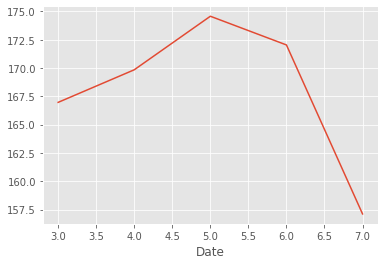

In [88]:
Uk_df['text'].str.len().groupby(by=Uk_df.index.month).mean().plot()

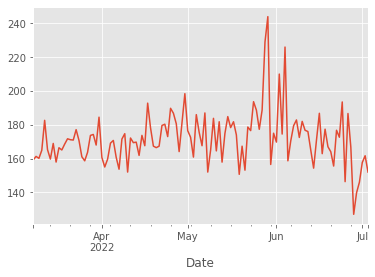

In [89]:
Uk_df['text'].str.len().resample('D').mean().plot() 

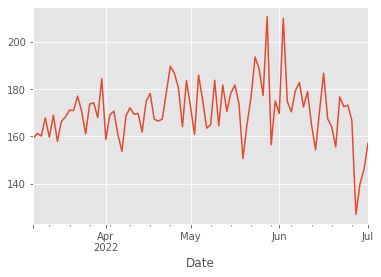

In [90]:
Uk_df['text'].str.len().resample('B').mean().plot() 

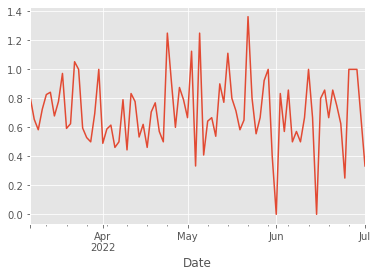

In [91]:
Uk_df['positivity'].resample('B').mean().plot() 

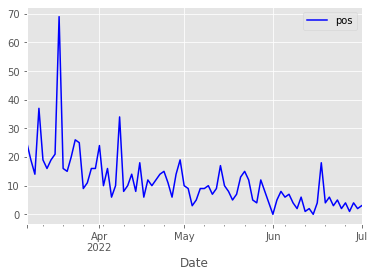

In [92]:
Uk_df['positivity'].resample('B').sum().plot(color = 'b',label = 'pos').legend() 

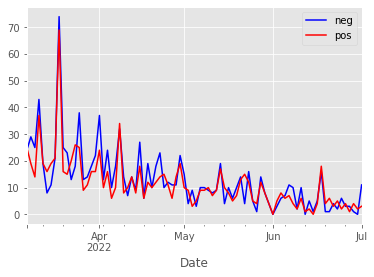

In [93]:
Uk_df['negative'].resample('B').sum().plot(color = 'b',label = 'neg').legend() 
Uk_df['positivity'].resample('B').sum().plot(color = 'r',label = 'pos').legend() 

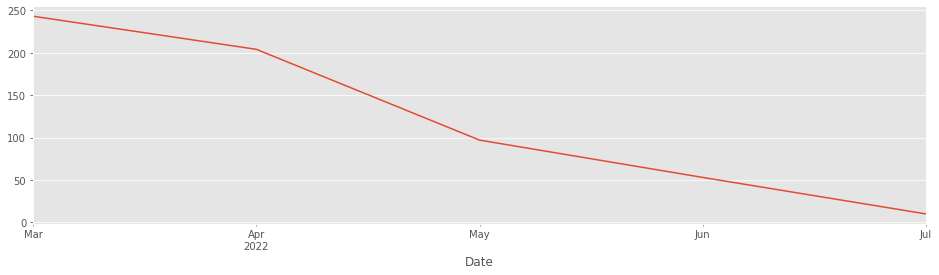

In [94]:
Uk_df['anger'].resample('M').sum().plot(figsize=(16,4))

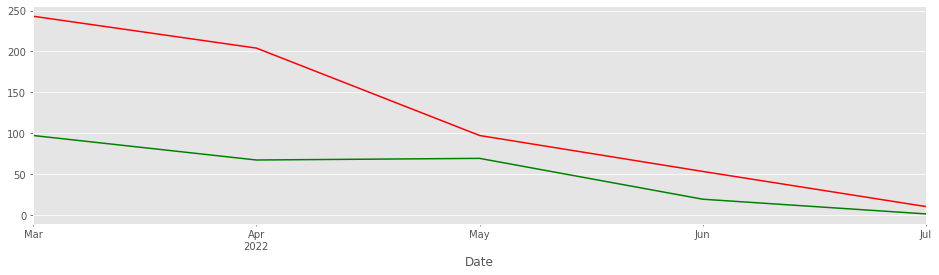

In [95]:
ax = Uk_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Uk_df['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

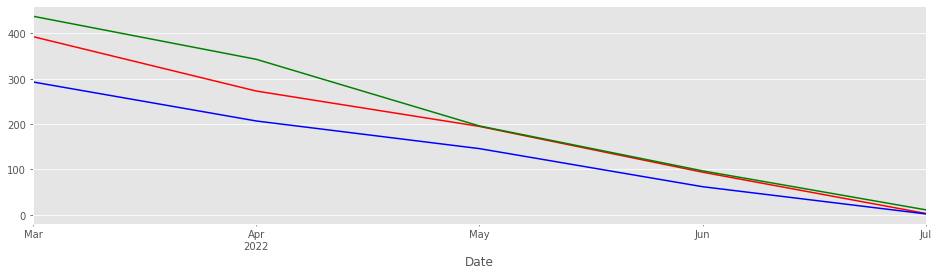

In [96]:
ax = Uk_df['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Uk_df['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
Uk_df['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

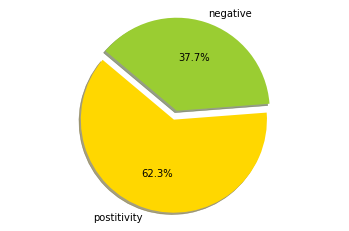

In [97]:
# Data to plot
labels = 'postitivity', 'negative'
sizes = [215, 130]
colors = ['gold', 'yellowgreen']
explode = (0.1, 0,) # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
 autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

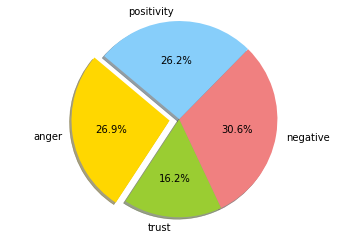

In [98]:
# Data to plot
labels = 'anger', 'trust', 'negative', 'positivity'
sizes = [215, 130, 245, 210]
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0, 0) # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
 autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

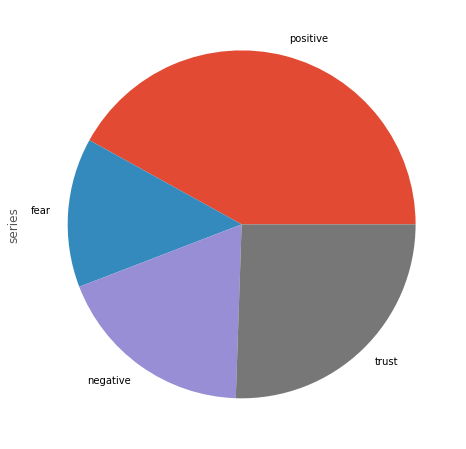

In [99]:
series = pd.Series(3 * np.random.rand(4),
  index =['positive', 'fear', 'negative', 'trust'], name ='series')
 
series.plot.pie(figsize =(8, 8))
plt.show()

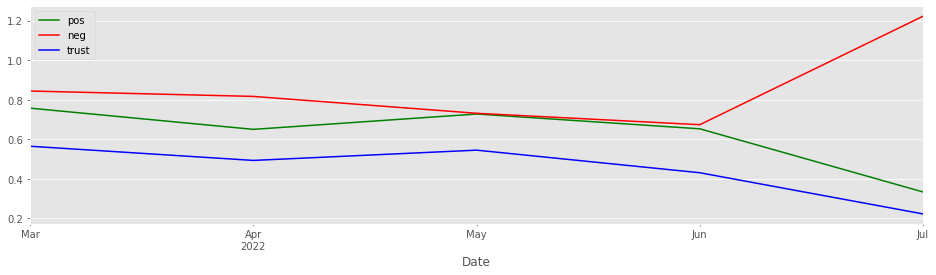

In [100]:
ax = Uk_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
Uk_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
Uk_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

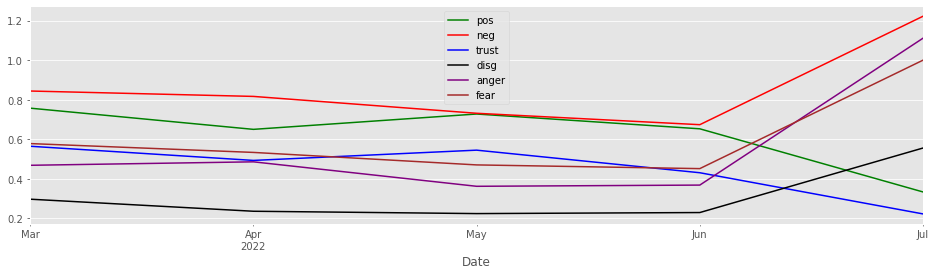

In [101]:
plt.style.use('ggplot')
ax = Uk_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
Uk_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
Uk_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

Uk_df['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

Uk_df['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

Uk_df['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

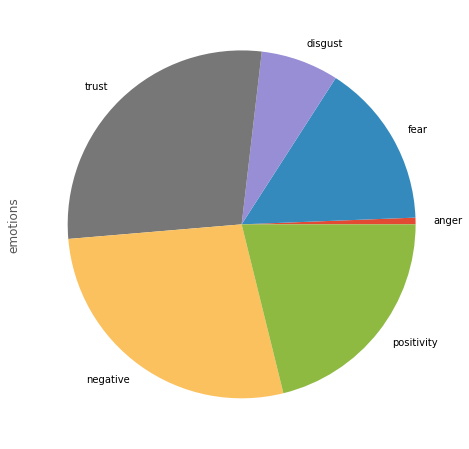

In [102]:
series = pd.Series(3 * np.random.rand(6),
  index =['anger', 'fear', 'disgust', 'trust', 'negative', 'positivity'], name ='emotions')
 
series.plot.pie(figsize =(8, 8))
plt.show()

Text(0, 0.5, 'Years')

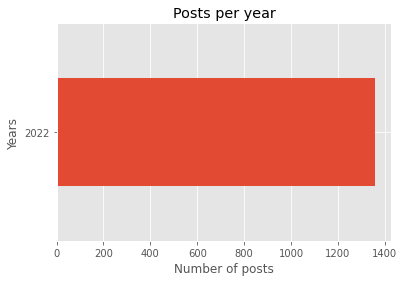

In [103]:
Uk_df['text'].groupby(by=Uk_df.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Hour of the day')

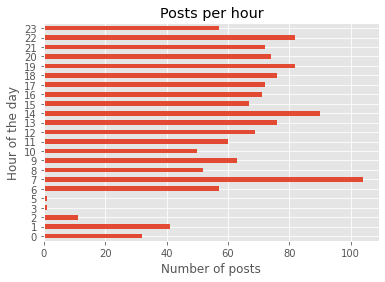

In [104]:
Uk_df['text'].groupby(by=Uk_df.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

Text(0, 0.5, 'Months')

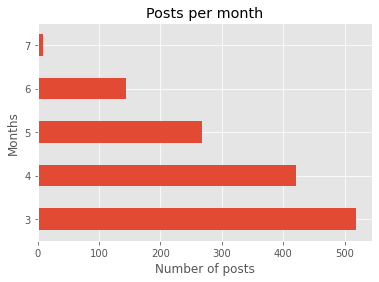

In [105]:
Uk_df['text'].groupby(by=Uk_df.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Months")

In [106]:
Uk_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
Date,,,,,,,,,,,,,,,,,,,,
2022-07-03 14:34:00,0,Τσεχία: Μαχητικά αεροσκάφη της θα επιτηρούν το...,03 Ιουλίου 2022 14:34,https://www.news247.gr/kosmos/tsechia-machitik...,"Υπό τις ευλογίες του ΝΑΤΟ, η Τσεχία θα αναλάβε...",ΝΑΤΟ,2022,Ιουλίου,03,14:34,0,1,1,0,1,1,1,0,0,1
2022-07-03 13:41:00,1,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2,0,0,1,1,0,0,2,2,2
2022-07-03 13:32:00,2,Στην Ελβετία ο Ν. Δένδιας,03 Ιουλίου 2022 13:32,https://www.news247.gr/politiki/stin-elvetia-o...,Στην Ελβετία θα βρεθεί τη Δευτέρα ο Ελληνας ΥΠ...,ΝΙΚΟΣ ΔΕΝΔΙΑΣ,2022,Ιουλίου,03,13:32,0,0,0,0,0,0,0,0,1,0
2022-07-02 20:54:00,3,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,1,1,0,0,0,1,0,0,1,0
2022-07-02 19:29:00,4,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,1,0,0,1,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-08 08:29:00,1355,Πόλεμος στην Ουκρανία: Τουλάχιστον 10 νεκροί α...,08 Μαρτίου 2022 08:29,https://www.news247.gr/kosmos/polemos-stin-oyk...,Πάνω από 10 άνθρωποι έχασαν τη ζωή τους από ρω...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,08:29,0,1,0,0,0,0,0,0,0,0
2022-03-08 06:56:00,1356,"""Συρρικνώνονται"" οι Ρώσοι και οι Ουκρανοί τουρ...",08 Μαρτίου 2022 06:56,https://www.news247.gr/tourismos/syrriknononta...,Η παρατεταμένη εμπόλεμη κατάσταση στην Ουκρανί...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:56,1,1,0,0,0,0,1,1,1,1
2022-03-08 06:39:00,1357,Πόλεμος στην Ουκρανία: Βομβάρδισαν κι άλλη πυρ...,08 Μαρτίου 2022 06:39,https://www.news247.gr/kosmos/polemos-stin-oyk...,Κορυφώνεται η αγωνία για την κατάπαυση του πυρ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,08,06:39,1,0,0,0,1,0,1,1,1,1


# Άνοιγμα του Russia_Doc

In [107]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [108]:
ru_df =pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/russia.tsv", sep='\t')
ru_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,3,13:41,2022-07-03 13:41:00
1,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,3,11:39,2022-07-03 11:39:00
2,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,2,20:54,2022-07-02 20:54:00
3,3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,2,19:29,2022-07-02 19:29:00
4,4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,02 Ιουλίου 2022 16:36,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,2022,Ιουλίου,2,16:36,2022-07-02 16:36:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,17 Μαρτίου 2022 09:33,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,2022,Μαρτίου,17,09:33,2022-03-17 09:33:00
1356,1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,17 Μαρτίου 2022 09:23,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,09:23,2022-03-17 09:23:00
1357,1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,17 Μαρτίου 2022 08:05,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,08:05,2022-03-17 08:05:00
1358,1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,17 Μαρτίου 2022 06:54,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,06:54,2022-03-17 06:54:00


In [109]:
#ru_df.dtypes

In [110]:
#καθαρισμός και τακτοποίηση του Df
Ru = ru_df[['Title', 'URL', 'text', 'About_text', 'created_at', 'Month', 'Day', 'Time', 'Date']]
Ru

,Title,URL,text,About_text,created_at,Month,Day,Time,Date
0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,3,13:41,2022-07-03 13:41:00
1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,03 Ιουλίου 2022 11:39,Ιουλίου,3,11:39,2022-07-03 11:39:00
2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,2,20:54,2022-07-02 20:54:00
3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,2,19:29,2022-07-02 19:29:00
4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,02 Ιουλίου 2022 16:36,Ιουλίου,2,16:36,2022-07-02 16:36:00
...,...,...,...,...,...,...,...,...,...
1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,17 Μαρτίου 2022 09:33,Μαρτίου,17,09:33,2022-03-17 09:33:00
1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 09:23,Μαρτίου,17,09:23,2022-03-17 09:23:00
1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 08:05,Μαρτίου,17,08:05,2022-03-17 08:05:00
1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 06:54,Μαρτίου,17,06:54,2022-03-17 06:54:00


In [111]:
#Ru.dtypes

In [112]:
Ru['Year'] = Ru.created_at.apply(lambda dt: dt.split(' ')[2])
Ru['Month'] = Ru.created_at.apply(lambda dt: dt.split(' ')[1])
Ru['Day'] = Ru.created_at.apply(lambda dt: dt.split(' ')[0])
Ru['Time'] = Ru.created_at.apply(lambda dt: dt.split(' ')[3])

months = {
    'Ιανουαρίου' : '01',
    'Φεβρουαρίου' : '02', 
    'Μαρτίου' : '03',
    'Απριλίου' : '04',
    'Μαΐου' : '05',
    'Ιουνίου': '06',
    'Ιουλίου' : '07',
    'Αυγούστου' : '08',
    'Σεπτεμβρίου' : '09',
    'Οκτωβρίου' : '10',
    'Νοεμβρίου' : '11',
    'Δεκεμβρίου' : '12',
     
}

Ru['Date'] = Ru.apply(lambda row: f'{months[row.Month]}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
Ru['Date'] = pd.to_datetime(Ru['Date'])


Ru

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,Title,URL,text,About_text,created_at,Month,Day,Time,Date,Year
0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,03 Ιουλίου 2022 11:39,Ιουλίου,03,11:39,2022-07-03 11:39:00,2022
2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,02,20:54,2022-07-02 20:54:00,2022
3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,02 Ιουλίου 2022 16:36,Ιουλίου,02,16:36,2022-07-02 16:36:00,2022
...,...,...,...,...,...,...,...,...,...,...
1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,17 Μαρτίου 2022 09:33,Μαρτίου,17,09:33,2022-03-17 09:33:00,2022
1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 09:23,Μαρτίου,17,09:23,2022-03-17 09:23:00,2022
1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 08:05,Μαρτίου,17,08:05,2022-03-17 08:05:00,2022
1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 06:54,Μαρτίου,17,06:54,2022-03-17 06:54:00,2022


In [113]:
#Ru.dtypes

In [114]:
Ru = Ru.rename(columns= {'About_text': 'Keywords'})
Ru

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,03 Ιουλίου 2022 11:39,Ιουλίου,03,11:39,2022-07-03 11:39:00,2022
2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,02 Ιουλίου 2022 20:54,Ιουλίου,02,20:54,2022-07-02 20:54:00,2022
3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,02 Ιουλίου 2022 16:36,Ιουλίου,02,16:36,2022-07-02 16:36:00,2022
...,...,...,...,...,...,...,...,...,...,...
1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,17 Μαρτίου 2022 09:33,Μαρτίου,17,09:33,2022-03-17 09:33:00,2022
1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 09:23,Μαρτίου,17,09:23,2022-03-17 09:23:00,2022
1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 08:05,Μαρτίου,17,08:05,2022-03-17 08:05:00,2022
1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 06:54,Μαρτίου,17,06:54,2022-03-17 06:54:00,2022


In [115]:
POLEMOS= Ru[Ru['Keywords']=='ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ']
POLEMOS

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,03 Ιουλίου 2022 13:41,Ιουλίου,03,13:41,2022-07-03 13:41:00,2022
3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,02 Ιουλίου 2022 19:29,Ιουλίου,02,19:29,2022-07-02 19:29:00,2022
6,Ουκρανία: Οι φιλορώσοι αυτονομιστές στο Ντονέτ...,https://www.news247.gr/kosmos/oykrania-oi-filo...,Σύμφωνα με τον ποινικό κώδικα της αποσχισθείσα...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,01 Ιουλίου 2022 23:27,Ιουλίου,01,23:27,2022-07-01 23:27:00,2022
7,Ουκρανία: Στους 21 οι νεκροί από επίθεση σε πο...,https://www.news247.gr/kosmos/oykrania-stoys-2...,Στο έλεος των βομβαρδισμών η Οδησσός. Δεκάδες ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,01 Ιουλίου 2022 21:50,Ιουλίου,01,21:50,2022-07-01 21:50:00,2022
10,Ουκρανία: Πολυκατοικία χτυπήθηκε από πύραυλο σ...,https://www.news247.gr/kosmos/oykrania-polykat...,Νέα πυραυλική επίθεση έπληξε πολυκατοικία στην...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,01 Ιουλίου 2022 07:34,Ιουλίου,01,07:34,2022-07-01 07:34:00,2022
...,...,...,...,...,...,...,...,...,...,...
1352,ΟΗΕ: Ξεπέρασαν τα 3 εκατομμύρια οι πρόσφυγες α...,https://www.news247.gr/kosmos/oie-xeperasan-ta...,Από τις 24 Φεβρουαρίου που μαίνεται ο πόλεμος ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 15:54,Μαρτίου,17,15:54,2022-03-17 15:54:00,2022
1353,Συνάντηση Πούτιν - Ζελένσκι μόνο για να σφραγι...,https://www.news247.gr/kosmos/synantisi-poytin...,Η Μόσχα λέει πως οποιαδήποτε συνάντηση Πούτιν ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 11:27,Μαρτίου,17,11:27,2022-03-17 11:27:00,2022
1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 09:23,Μαρτίου,17,09:23,2022-03-17 09:23:00,2022
1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,17 Μαρτίου 2022 08:05,Μαρτίου,17,08:05,2022-03-17 08:05:00,2022


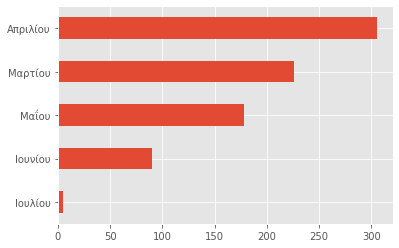

In [116]:
POLEMOS['Month'].value_counts().head(10).sort_values().plot(kind='barh')

In [117]:
ΟΥΚΡΑΝΙΑ= Ru[Ru['Keywords']=='ΟΥΚΡΑΝΙΑ']
ΟΥΚΡΑΝΙΑ

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year
96,Ουκρανία: Το Κίεβο σχεδιάζει να ξαναρχίσει ειρ...,https://www.news247.gr/kosmos/oykrania-to-kiev...,Επανεκκίνηση διαπραγματεύσεων προς τα τέλη Αυγ...,ΟΥΚΡΑΝΙΑ,19 Ιουνίου 2022 08:50,Ιουνίου,19,08:50,2022-06-19 08:50:00,2022
173,"Οι Ουκρανοί ""διώχνουν"" τον Τσαϊκόφσκι και τον ...",https://www.news247.gr/kosmos/oi-oykranoi-dioc...,"Επιχείρηση ""εκκαθάρισης"" ρωσικών ονομάτων από ...",ΟΥΚΡΑΝΙΑ,07 Ιουνίου 2022 20:42,Ιουνίου,07,20:42,2022-06-07 20:42:00,2022
177,Ουκρανία: Ορατός ο κίνδυνος για επιδημία χολέρ...,https://www.news247.gr/kosmos/oykrania-oratos-...,Με το πόσιμο νερό να έχει μολυνθεί και τα κεντ...,ΟΥΚΡΑΝΙΑ,07 Ιουνίου 2022 17:35,Ιουνίου,07,17:35,2022-06-07 17:35:00,2022
182,Ουκρανία: Νέο πακέτο στρατιωτικής βοήθειας από...,https://www.news247.gr/kosmos/oykrania-neo-pak...,Νέο πακέτο στρατιωτικής βοήθειας θα σταλεί από...,ΟΥΚΡΑΝΙΑ,07 Ιουνίου 2022 00:41,Ιουνίου,07,00:41,2022-06-07 00:41:00,2022
205,Κίεβο: Η Τουρκία αγοράζει σιτηρά που έχουν κλα...,https://www.news247.gr/kosmos/kataggelia-oykra...,Η Τουρκία αγοράζει μέσω Ρωσίας σιτηρά που έχου...,ΟΥΚΡΑΝΙΑ,03 Ιουνίου 2022 12:57,Ιουνίου,03,12:57,2022-06-03 12:57:00,2022
241,"Πόλεμος στην Ουκρανία - NATO: Στο ""τραπέζι"" η ...",https://www.news247.gr/kosmos/polemos-stin-oyk...,Το ΝΑΤΟ θεωρεί πως έχει πλέον «δικαίωμα» να αν...,ΟΥΚΡΑΝΙΑ,30 Μαΐου 2022 08:01,Μαΐου,30,08:01,2022-05-30 08:01:00,2022
296,Ουκρανία: Ένταλμα σύλληψης του πρώην προέδρου ...,https://www.news247.gr/kosmos/oykrania-entalma...,Ο πρώην πρόεδρος της Ουκρανίας κατηγορείται γι...,ΟΥΚΡΑΝΙΑ,23 Μαΐου 2022 21:45,Μαΐου,23,21:45,2022-05-23 21:45:00,2022
345,Πόλεμος στην Ουκρανία: Συνεχίζεται το σφυροκόπ...,https://www.news247.gr/kosmos/oykrania-dekades...,Πληροφορίες κάνουν λόγο για δέκα τουλάχιστον ν...,ΟΥΚΡΑΝΙΑ,19 Μαΐου 2022 07:52,Μαΐου,19,07:52,2022-05-19 07:52:00,2022
407,Ουκρανία: Κατηγορεί τη Ρωσία ότι μετέφερε με τ...,https://www.news247.gr/kosmos/oykrania-katigor...,Σύμφωνα με τη Συνήγορο των Ανθρωπίνων Δικαιωμά...,ΟΥΚΡΑΝΙΑ,13 Μαΐου 2022 18:18,Μαΐου,13,18:18,2022-05-13 18:18:00,2022
431,Ο μακρύς πόλεμος του Πούτιν και η αγωνία για τ...,https://www.news247.gr/kosmos/o-makrys-polemos...,Ο πόλεμος δεν θα λήξει ούτε εύκολα για τον Πού...,ΟΥΚΡΑΝΙΑ,11 Μαΐου 2022 14:57,Μαΐου,11,14:57,2022-05-11 14:57:00,2022


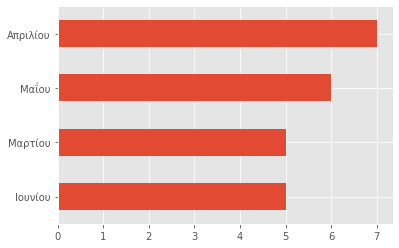

In [118]:
ΟΥΚΡΑΝΙΑ['Month'].value_counts().head(10).sort_values().plot(kind='barh')

In [119]:
Ru['text'] = Ru ['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


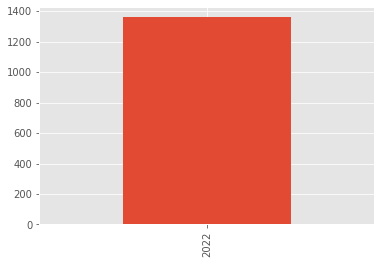

In [120]:
Ru['Year'].value_counts().plot(kind='bar')

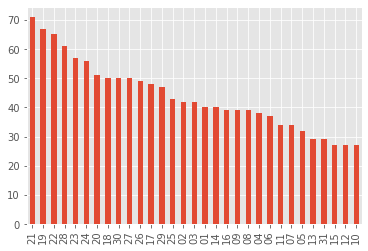

In [121]:
Ru['Day'].value_counts().plot(kind='bar')

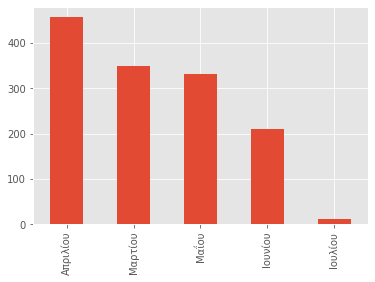

In [122]:
Ru['Month'].value_counts().plot(kind='bar')

In [123]:
Keywords_data = Ru.groupby(['Keywords']).count()['Title'].sort_values(ascending=False)


day_data = Ru.groupby(['Day']).count()['Keywords']
(day_data,Keywords_data)

(Day
 01    40
 02    42
 03    42
 04    38
 05    32
 06    37
 07    34
 08    39
 09    39
 10    27
 11    34
 12    27
 13    29
 14    40
 15    27
 16    39
 17    48
 18    50
 19    67
 20    51
 21    71
 22    65
 23    57
 24    56
 25    43
 26    49
 27    50
 28    61
 29    47
 30    50
 31    29
 Name: Keywords, dtype: int64, Keywords
 ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ    804
 ΡΩΣΙΑ                    187
 ΦΥΣΙΚΟ ΑΕΡΙΟ              30
 ΕΥΡΩΠΑΪΚΗ ΕΝΩΣΗ           27
 ΠΟΥΤΙΝ                    26
                         ... 
 ALPHA BANK                 1
 ΚΡΗΤΗ                      1
 ΚΥΠΡΟΣ                     1
 ΛΙΒΥΗ                      1
 ΦΩΤΙΑ                      1
 Name: Title, Length: 100, dtype: int64)

In [124]:
Keywords_data.head(13)
keywords_data = Keywords_data.head(13)
keywords_data


Keywords
ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ    804
ΡΩΣΙΑ                    187
ΦΥΣΙΚΟ ΑΕΡΙΟ              30
ΕΥΡΩΠΑΪΚΗ ΕΝΩΣΗ           27
ΠΟΥΤΙΝ                    26
ΝΑΤΟ                      23
ΟΥΚΡΑΝΙΑ                  23
ΓΕΡΜΑΝΙΑ                  18
ΒΟΛΟΝΤΙΜΙΡ ΖΕΛΕΝΣΚΙ       17
ΗΠΑ                       17
ΚΥΡΙΑΚΟΣ ΜΗΤΣΟΤΑΚΗΣ        9
ΤΟΥΡΚΙΑ                    8
ΟΥΓΓΑΡΙΑ                   6
Name: Title, dtype: int64

In [125]:
day_data.head(31)
Day_data = day_data.head(31)
Day_data


Day
01    40
02    42
03    42
04    38
05    32
06    37
07    34
08    39
09    39
10    27
11    34
12    27
13    29
14    40
15    27
16    39
17    48
18    50
19    67
20    51
21    71
22    65
23    57
24    56
25    43
26    49
27    50
28    61
29    47
30    50
31    29
Name: Keywords, dtype: int64

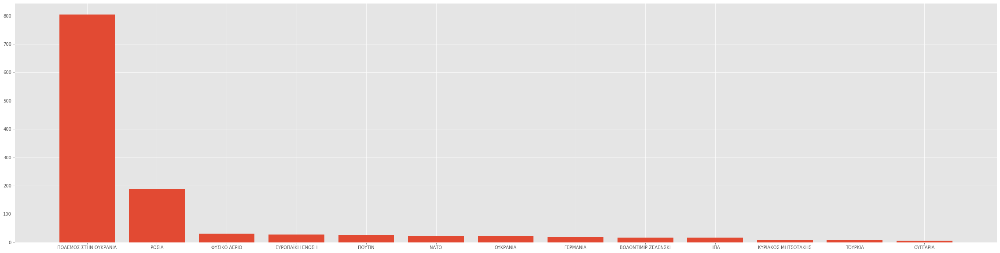

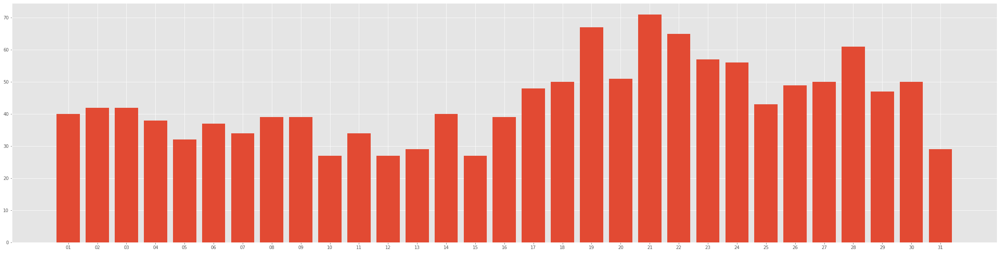

In [126]:
plt.figure(figsize=(40,10))
plt.bar(keywords_data.keys(),keywords_data,)
plt.show()

plt.figure(figsize=(40,10))
plt.bar(Day_data.keys(),Day_data,)
plt.show()

# Wordcloud Russia

In [127]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import WordCloud
from collections import Counter
from nltk.util import ngrams
import spacy
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [128]:
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 5.2 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [129]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['έχετε',
 'κάθε',
 'κατά',
 'οποίους',
 'έγινε',
 'είναι',
 'ανάμεσα',
 'μεμιάς',
 'ναι',
 'συχνών',
 'κάμποσης',
 'όσοι',
 'τελικά',
 'στην',
 'μπρος',
 'όλων',
 'έτερες',
 'προχτές',
 'καθενός',
 'λιγότερο']

In [130]:
#list(STOPWORDS)[0:20]

In [131]:
text = Ru['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'"Έπεσε" από τις ρωσικές δυνάμεις η πόλη Λισιτσάνσκ, ενώ το Κίεβο παραδέχθηκε τα κέρδη των Ρώσων στην πόλη Σημαντικό χτύπημα στη Μελιτόπολη, χωρίς ωστόσο να υπάρχουν θύματαΟ  Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του Ινστιτούτου Θεωρητικής και Εφαρμοσμένης Μηχανικής του Νοβοσιμπίρσκ συνελήφθη για "προδοσία" και μεταφέρθηκε σε φυλακή της ΜόσχαςΟ Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκρανία εξαπέλυσε πυραυλικά πλήγματα εναντίον στρατιωτικών εγκαταστάσεων "Μας προκαλούν", τονίζειΤο Λισίτσανσκ της ανατολικής Ουκρανίας είναι πλέον ένα από τα επίκεντρα του πολέμου στην Ουκρανία που εξακολουθεί να μαίνεται Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς το λιμάνι του Πειραιά το ρωσικό δεξαμενόπλοιο "Lana" Είχε δεσμευτεί τον περασμένο Απρίλιο κατόπιν εντολής της Αρχής για την Νομιμοποίηση Εσόδων από Εγκληματικές ΔραστηριότητεςΠιθανή λύση του προβλήματος με το φυσικό αέριο, η επιστροφή στην πυρηνική ενέργεια, σύμφωνα με τον πρόεδρο του Διεθνούς Οργανισμού ΕνέργειαςΣύμφωνα με τον ποινικό κώδικα

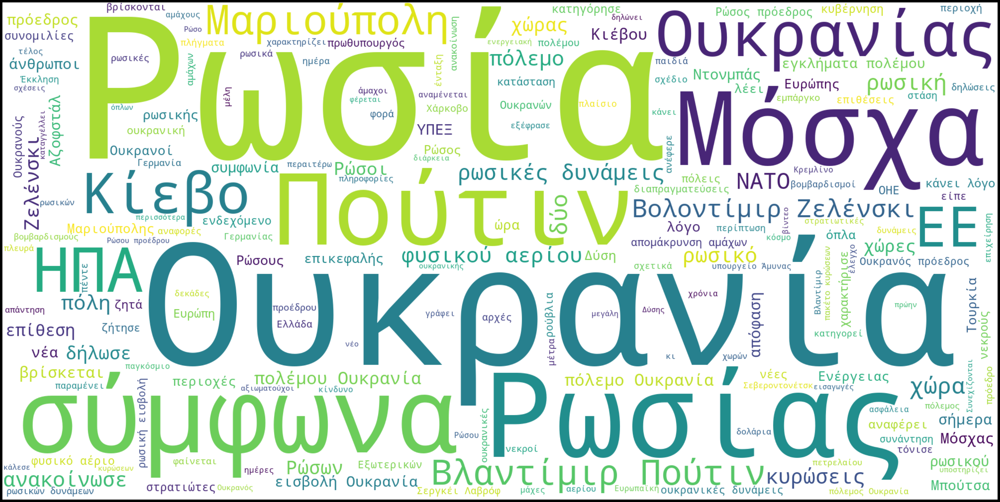

In [132]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'white'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

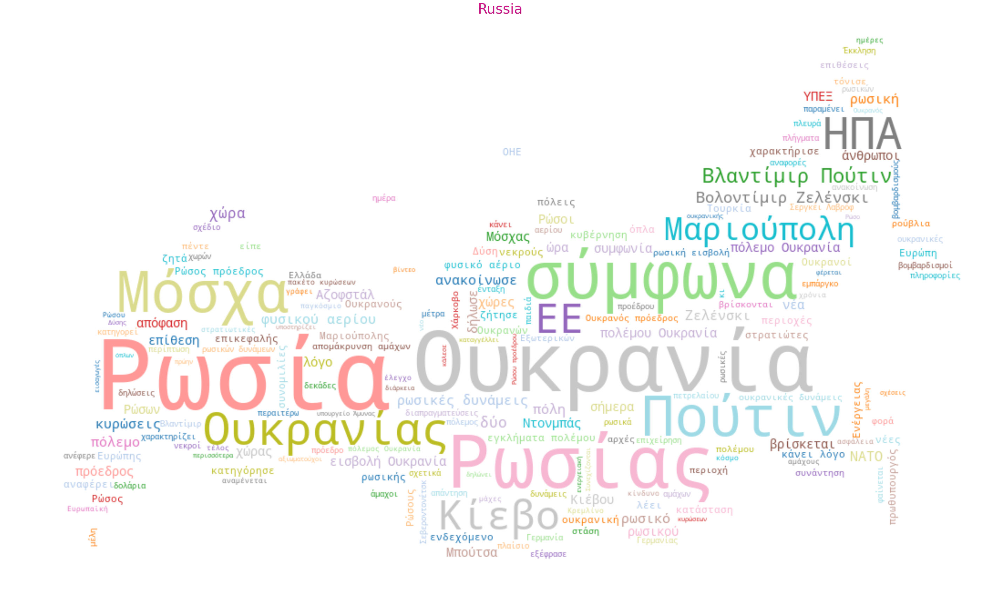

In [133]:
from PIL import Image
import numpy as np
mask = np.array(Image.open("/content/gdrive/MyDrive/Colab Notebooks/Russia2.jpg")) #Λογικά θα έχεις κάνει από πριν mount στο drive. Αν όχι κάνε και αυτό για να τραβήξει τη μάσκα.

def generate_name_wordcloud(data, title, mask=mask):
  wordcloud_name = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    scale=1,
    max_words=200,
    colormap='tab20',#Μπες εδώ και διάλεξε colourmap https://matplotlib.org/3.5.0/tutorials/colors/colormaps.html
    mask=mask,
    background_color='white',
    collocations=True).generate(text)#Το όνομα του text που θες να κάνεις word cloud
  plt.figure(figsize = (40, 40))#Αυτό ρύθμισέ το και ανάλογα με την εικόνα. Φρόντισε γενικά να έχεις μεγάλες εικόνες για να είναι ευανάγνωστες οι λέξεις. Οι μικρές αν τις κάνεις ζουμ κάνουν πίξελ και οι λέξεις δεν φαίνονται καλά.
  plt.imshow(wordcloud_name, interpolation = 'bilinear')
  plt.axis('off')
  plt.tight_layout(pad=2)
  plt.title("Russia", size= 40, color='mediumvioletred')
  plt.savefig("name.png", format="png") #Δεν έχω καταλάβει πού το κάνει save.
  plt.show()
  
generate_name_wordcloud(text, '' , mask=mask)

In [134]:
word_count = Counter(" ".join(Ru["text"]).split())
word_count = {word.lower() : count for word, count in word_count.items() if not word.lower() in STOPWORDS}
word_count = pd.DataFrame(data={
    'word': word_count.keys(),
    'count': word_count.values()
})

word_count.sort_values('count',ascending=False).head(15)

,word,count
45,της,1014
72,με,481
27,ο,409
14,των,351
69,που,334
123,στο,321
5,η,218
134,ρωσία,162
51,ουκρανία,134
203,πούτιν,104


In [135]:
from collections import Counter
Counter(" ".join(Ru["text"]).split()).most_common(16)

[('της', 1014),
 ('του', 790),
 ('και', 674),
 ('την', 645),
 ('για', 644),
 ('να', 628),
 ('από', 546),
 ('το', 535),
 ('η', 499),
 ('με', 481),
 ('στην', 475),
 ('τη', 426),
 ('ο', 409),
 ('τον', 353),
 ('των', 351),
 ('σε', 335)]

In [136]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

έχετε


In [137]:
Ru['text_no_stopwords'] = Ru['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Ru['text_no_stopwords'] = Ru['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Ru['clean_text_no_stopwords'] = Ru['text']
#for stopword in nlp.Defaults.stop_words:
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [138]:
freq = Counter(" ".join(Ru["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('Ουκρανία', 306),
 ('Ρωσία', 260),
 ('Η', 218),
 ('Ο', 194),
 ('Πούτιν', 162),
 ('Ρωσίας', 149),
 ('Ουκρανίας', 114),
 ('Ζελένσκι', 112),
 ('Μόσχα', 103),
 ('σύμφωνα', 101),
 ('Οι', 94),
 ('πολέμου', 88),
 ('πρόεδρος', 84),
 ('ΗΠΑ', 84),
 ('Κίεβο', 80),
 ('Το', 79)]

In [139]:
import numpy as np


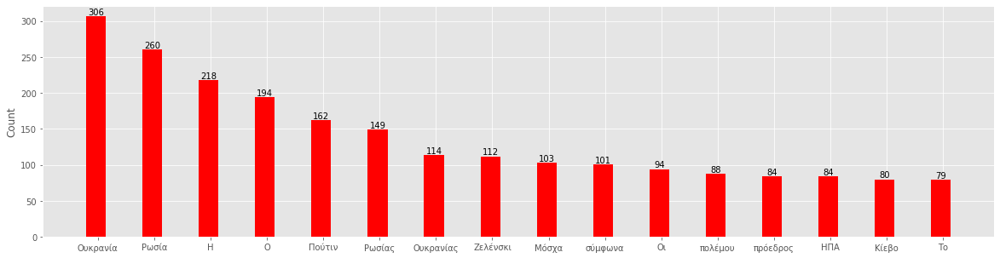

In [140]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

In [141]:
Ru.resample(rule='D',on='Date').count()

,Title,URL,text,Keywords,created_at,Month,Day,Time,Date,Year,text_no_stopwords,clean_text_no_stopwords
Date,,,,,,,,,,,,
2022-03-17,22,22,22,22,22,22,22,22,22,22,22,22
2022-03-18,22,22,22,22,22,22,22,22,22,22,22,22
2022-03-19,26,26,26,26,26,26,26,26,26,26,26,26
2022-03-20,18,18,18,18,18,18,18,18,18,18,18,18
2022-03-21,28,28,28,28,28,28,28,28,28,28,28,28
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-29,8,8,8,8,8,8,8,8,8,8,8,8
2022-06-30,5,5,5,5,5,5,5,5,5,5,5,5
2022-07-01,7,7,7,7,7,7,7,7,7,7,7,7


# Vectorizing Russia

In [142]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [143]:
count_vector = cv.fit_transform(Ru['text'])

In [144]:
count_vector.shape

(1360, 6968)

In [145]:
cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,03,10,100,100ή,100η,1084,11,119,11χρονο,...,ύστερα,ύφεσης,ύψους,ύψωσαν,ώθηση,ώρα,ώρας,ώρες,ώριμη,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [146]:
#cv.vocabulary_

In [147]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [148]:
count_vector = cv.fit_transform(Ru['text'])

In [149]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,100,άμυνας,άνθρωποι,έκκληση,έλεγχο,ένταξη,αέριο,αερίου,αζοφστάλ,...,χάρκοβο,χαρακτήρισε,χρήση,χωρών,χώρα,χώρας,χώρες,όπλα,όπλων,ώρα
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [150]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [151]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ΗΠΑ,ΟΗΕ,Ρωσία,άμαχος,άμυνα,άνθρωπος,έκκληση,έλεγχος,ένταξη,ένωση,...,φυσικός,χάνω,χάρκοβο,χαρακτηρίζω,χρήση,χρησιμοποιώ,χρόνος,χώρα,όπλο,ώρα
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [152]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,βλαντίμιρ,βολοντίμιρ,δυνάμεις,δύο,ζελένσκι,ηπα,κίεβο,μαριούπολη,μόσχα,ουκρανία,ουκρανίας,πολέμου,πούτιν,πρόεδρος,πόλεμο,ρωσία,ρωσίας,ρωσική,ρωσικό,σύμφωνα
0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [153]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\bουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκρανή,ουκρανία,ουκρανίας,ουκρανικά,ουκρανικές,ουκρανική,ουκρανικής,ουκρανικού,ουκρανικούς,ουκρανικό,ουκρανικός,ουκρανικών,ουκρανοί,ουκρανού,ουκρανούς,ουκρανό,ουκρανός,ουκρανών
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [154]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) #token_pattern = '\\bουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,απομάκρυνση αμάχων,βλαντίμιρ πούτιν,βολοντίμιρ ζελένσκι,εγκλήματα πολέμου,εισβολή ουκρανία,κάνει λόγο,ουκρανικές δυνάμεις,ουκρανός πρόεδρος,πακέτο κυρώσεων,πολέμου ουκρανία,πόλεμο ουκρανία,πόλεμος ουκρανία,ρωσικές δυνάμεις,ρωσική εισβολή,ρωσικό πετρέλαιο,ρωσικών δυνάμεων,ρώσος πρόεδρος,σεργκέι λαβρόφ,φυσικού αερίου,φυσικό αέριο
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [155]:
results.sum(axis =0).sort_values(ascending = False)

βλαντίμιρ πούτιν       69
βολοντίμιρ ζελένσκι    64
φυσικού αερίου         47
ρωσικές δυνάμεις       45
πολέμου ουκρανία       34
πόλεμο ουκρανία        33
εισβολή ουκρανία       29
εγκλήματα πολέμου      26
φυσικό αέριο           25
ρωσική εισβολή         20
ρώσος πρόεδρος         20
κάνει λόγο             20
σεργκέι λαβρόφ         19
απομάκρυνση αμάχων     18
ουκρανός πρόεδρος      17
ουκρανικές δυνάμεις    17
ρωσικών δυνάμεων       16
πακέτο κυρώσεων        14
πόλεμος ουκρανία       14
ρωσικό πετρέλαιο       14
dtype: int64

In [156]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()

βλαντίμιρ πούτιν       69
βολοντίμιρ ζελένσκι    64
φυσικού αερίου         47
ρωσικές δυνάμεις       45
πολέμου ουκρανία       34
dtype: int64

In [157]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bουκ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\br[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,radio,repower,repowereu,reuters,ria,riot,roscosmos,rosneft,rt,ryanair
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [158]:
results.sum(axis =0).sort_values(ascending = False)

rt           4
reuters      3
roscosmos    2
radio        1
repower      1
repowereu    1
ria          1
riot         1
rosneft      1
ryanair      1
dtype: int64

In [159]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['ουκρανια', 'ρωσια', 'πολεμος']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ru['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκρανια,ρωσια,πολεμος
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [160]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [161]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Ru['text'])  #finds the tfidf score with normalization

In [162]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,100,20,200,2022,24,40,azovstal,g7,gazprom,...,χτύπημα,χωρών,χώρα,χώρας,χώρες,όλαφ,όπλα,όπλων,ώρα,ώρες
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.382518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [163]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[1. 0. 0. ... 0. 0. 0.]]


In [164]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[1.         0.         0.         ... 0.         0.         0.        ]
 [0.         1.         0.         ... 0.68366479 0.         0.        ]
 [0.         0.         1.         ... 0.         0.06868302 0.        ]
 ...
 [0.         0.68366479 0.         ... 1.         0.         0.        ]
 [0.         0.         0.06868302 ... 0.         1.         0.        ]
 [0.         0.         0.         ... 0.         0.         1.        ]]


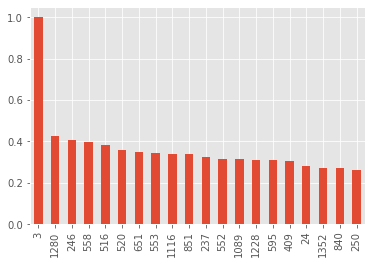

In [165]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [166]:
Ru['text'].loc[3]

'Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι πλέον ένα από τα επίκεντρα του πολέμου στην Ουκρανία που εξακολουθεί να μαίνεται. '

In [167]:
Ru['text'].loc[253]

'Σε πρώτο πλάνο το ουκρανικό ζήτημα, η επισιτιστική ασφάλεια και η άμυνα, ενώ εντείνονται οι διπλωματικές ζυμώσεις. Νέες συνομιλίες των προέδρων Ρωσίας και Ουκρανίας με Ευρωπαίους ηγέτες. '

# Emolex Russia

In [168]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)
emolex_df

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [169]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [170]:
Ru_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/russia.tsv", sep='\t')
Ru_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,3,13:41,2022-07-03 13:41:00
1,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,3,11:39,2022-07-03 11:39:00
2,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,2,20:54,2022-07-02 20:54:00
3,3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,2,19:29,2022-07-02 19:29:00
4,4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,02 Ιουλίου 2022 16:36,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,2022,Ιουλίου,2,16:36,2022-07-02 16:36:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,17 Μαρτίου 2022 09:33,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,2022,Μαρτίου,17,09:33,2022-03-17 09:33:00
1356,1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,17 Μαρτίου 2022 09:23,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,09:23,2022-03-17 09:23:00
1357,1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,17 Μαρτίου 2022 08:05,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,08:05,2022-03-17 08:05:00
1358,1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,17 Μαρτίου 2022 06:54,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,06:54,2022-03-17 06:54:00


In [171]:
Ru_df.dtypes

Unnamed: 0     int64
Title         object
created_at    object
URL           object
text          object
About_text    object
Year           int64
Month         object
Day            int64
Time          object
Date          object
dtype: object

In [172]:
Ru_df['Year'] = Ru_df.created_at.apply(lambda dt: dt.split(' ')[2])
Ru_df['Month'] = Ru_df.created_at.apply(lambda dt: dt.split(' ')[1])
Ru_df['Day'] = Ru_df.created_at.apply(lambda dt: dt.split(' ')[0])
Ru_df['Time'] = Ru_df.created_at.apply(lambda dt: dt.split(' ')[3])

months = {
    'Ιανουαρίου' : '01',
    'Φεβρουαρίου' : '02', 
    'Μαρτίου' : '03',
    'Απριλίου' : '04',
    'Μαΐου' : '05',
    'Ιουνίου': '06',
    'Ιουλίου' : '07',
    'Αυγούστου' : '08',
    'Σεπτεμβρίου' : '09',
    'Οκτωβρίου' : '10',
    'Νοεμβρίου' : '11',
    'Δεκεμβρίου' : '12',
     
}

Ru_df['Date'] = Ru_df.apply(lambda row: f'{months[row.Month]}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
Ru_df['Date'] = pd.to_datetime(Ru_df['Date'])


Ru_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2022-07-03 13:41:00
1,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,03,11:39,2022-07-03 11:39:00
2,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,2022-07-02 20:54:00
3,3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,2022-07-02 19:29:00
4,4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,02 Ιουλίου 2022 16:36,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,2022,Ιουλίου,02,16:36,2022-07-02 16:36:00
...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,17 Μαρτίου 2022 09:33,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,2022,Μαρτίου,17,09:33,2022-03-17 09:33:00
1356,1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,17 Μαρτίου 2022 09:23,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,09:23,2022-03-17 09:23:00
1357,1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,17 Μαρτίου 2022 08:05,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,08:05,2022-03-17 08:05:00
1358,1358,Πόλεμος στην Ουκρανία: Διπλωματικό θρίλερ - Αγ...,17 Μαρτίου 2022 06:54,https://www.news247.gr/kosmos/polemos-stin-oyk...,"Συνεχίζεται η ρωσική εισβολή στην Ουκρανία, εν...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,06:54,2022-03-17 06:54:00


In [173]:
#Ru_df.dtypes

In [174]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [175]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [176]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(Ru_df['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [177]:
wordcount_df.shape

(1360, 13161)

In [178]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [179]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [180]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

In [181]:
Ru_df.head(3)

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,Date
0,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2022-07-03 13:41:00
1,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,03,11:39,2022-07-03 11:39:00
2,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,2022-07-02 20:54:00


In [182]:
Ru_df['anger'] = wordcount_df[angry_words].sum(axis=1)
Ru_df['positivity'] = wordcount_df[positive_words].sum(axis=1)
Ru_df['joy'] = wordcount_df[joy_words].sum(axis=1)
Ru_df['disgust'] = wordcount_df[disgust_words].sum(axis=1)
Ru_df['surprise'] = wordcount_df[surprise_words].sum(axis=1)
Ru_df['trust'] = wordcount_df[trust_words].sum(axis=1)
Ru_df['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)
Ru_df['sadness'] = wordcount_df[sadness_words].sum(axis=1)
Ru_df['negative'] = wordcount_df[negative_words].sum(axis=1)
Ru_df['fear'] = wordcount_df[fear_words].sum(axis=1)

In [183]:
#Ru_df

In [184]:
max = 0
happiest_tweet = ""
for i in range(0,len(Ru_df)):
  #print(Ru_df.iloc[i]['positivity'])
  if Ru_df.iloc[i]['positivity'] > max:
    happiest_tweet = Ru_df.iloc[i]['text']
    max = Ru_df.iloc[i]['positivity']


happiest_tweet

'"Ώριμη" η συζήτηση για το έκτο πακέτο κυρώσεων σε βάρος της Ρωσίας αλλά δεν υπάρχει ακόμα συμφωνία, τόνισε η πρόεδρος της Κομισιόν, Ούρσουλα φον ντερ Λάιεν κατά την έκτακτη Σύνοδο Κορυφής στις Βρυξέλλες.'

In [185]:
max = 0
negative_tweet = ""
for i in range(0,len(Ru_df)):
  #print(Ru_df.iloc[i]['positivity'])
  if Ru_df.iloc[i]['negative'] > max:
    negative_tweet = Ru_df.iloc[i]['text']
    max = Ru_df.iloc[i]['negative']


negative_tweet

'Ο Βλαντίμιρ Πούτιν ξεκίνησε την επίθεση εναντίον της Ουκρανίας χωρίς ενδεχομένως να περιμένει τη διεθνή αντίδραση. Η Δύση συσπειρώθηκε. Ο πόλεμος, αντίθετος στο διεθνές δίκαιο, καταδικάζεται αλλά συνεχίζεται. Οι εμπειρογνώμονες συγκεντρώνουν αποδείξεις για πιθανά εγκλήματα πολέμου, την ώρα που όλα συγκλίνουν στο ότι χρειάζεται πολιτική βούληση.'

In [186]:
max = 0
saddest_tweet = ""
for i in range(0,len(Ru_df)):
  #print(Uk_df.iloc[i]['positivity'])
  if Ru_df.iloc[i]['sadness'] > max:
    saddest_tweet = Ru_df.iloc[i]['text']
    max = Ru_df.iloc[i]['sadness']

saddest_tweet

'Νεκρός από πυρά ελεύθερου σκοπευτή στο Χάρκοβο, "έπεσε" ένας από τους πιο διαβόητους μισθοφόρους του ρωσικού στρατού. Είχε συμμετάσχει -μεταξύ άλλων- στη σφαγή αμάχων στο Ντονμπάς.'

In [187]:
max = 0
fear_tweet = ""
for i in range(0,len(Ru_df)):
  #print(Ru_df.iloc[i]['positivity'])
  if Ru_df.iloc[i]['fear'] > max:
    fear_tweet = Ru_df.iloc[i]['text']
    max = Ru_df.iloc[i]['fear']

fear_tweet

'Χωρίς συμφωνία και πάλι οι κυβερνήσεις των χωρών της ΕΕ αναφορικά με το εμπάργκο στο ρωσικό πετρέλαιο. Η διαμάχη για την πρόταση για πιο "ήπιο" μέτρο, που θα ηρεμήσει την Ουγγαρία. '

In [188]:
max = 0
trust_tweet = ""
for i in range(0,len(Ru_df)):
  #print(Ru_df.iloc[i]['positivity'])
  if Ru_df.iloc[i]['trust'] > max:
    trust_tweet = Ru_df.iloc[i]['text']
    max = Ru_df.iloc[i]['trust']

trust_tweet

'Σε τηλεφωνική επικοινωνία με τον Βλαντίμιρ Πούτιν ο πρόεδρος της Φινλανδίας τον ενημέρωσε για την πρόθεση της χώρας του να ενταχθεί στο ΝΑΤΟ. Για "λάθος" και "αρνητικό αντίκτυπο στις σχέσεις των δύο χωρών" έκανε λόγο ο ρώσος πρόεδρος.'

In [189]:
Ru_df.set_index('Date' , inplace=True)

In [190]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')


In [191]:
Ru_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
Date,,,,,,,,,,,,,,,,,,,,
2022-07-03 13:41:00,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2,0,0,1,1,0,0,2,2,2
2022-07-03 11:39:00,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,03,11:39,2,1,0,1,1,1,1,2,2,2
2022-07-02 20:54:00,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,1,1,0,0,0,1,0,0,1,0
2022-07-02 19:29:00,3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,1,0,0,1,0,0,0,0,1,1
2022-07-02 16:36:00,4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,02 Ιουλίου 2022 16:36,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,2022,Ιουλίου,02,16:36,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-17 09:33:00,1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,17 Μαρτίου 2022 09:33,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,2022,Μαρτίου,17,09:33,0,1,0,0,2,0,0,0,0,0
2022-03-17 09:23:00,1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,17 Μαρτίου 2022 09:23,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,09:23,1,3,1,1,0,2,2,2,3,3
2022-03-17 08:05:00,1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,17 Μαρτίου 2022 08:05,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,08:05,0,0,0,1,0,0,1,0,1,1


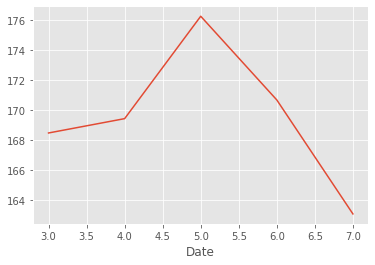

In [192]:
Ru_df['text'].str.len().groupby(by=Ru_df.index.month).mean().plot()

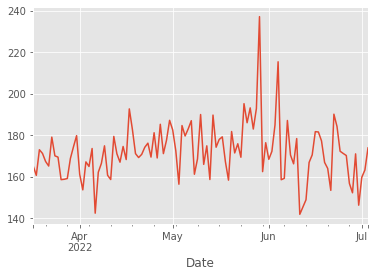

In [193]:
Ru_df['text'].str.len().resample('D').mean().plot() 

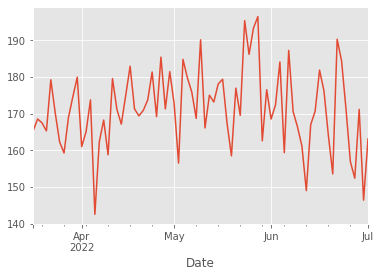

In [194]:
Ru_df['text'].str.len().resample('B').mean().plot() 

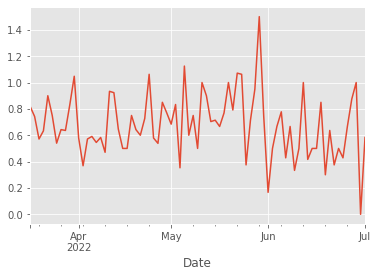

In [195]:
Ru_df['positivity'].resample('B').mean().plot() 

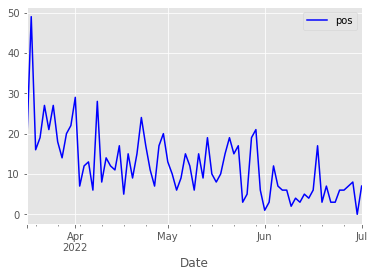

In [196]:
Ru_df['positivity'].resample('B').sum().plot(color = 'b',label = 'pos').legend() 

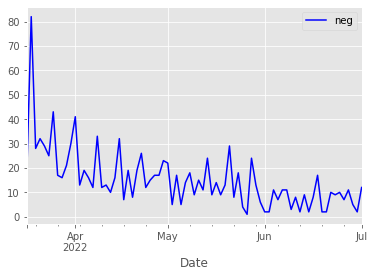

In [197]:
Ru_df['negative'].resample('B').sum().plot(color = 'b',label = 'neg').legend() 

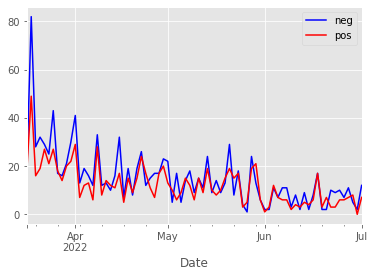

In [198]:
Ru_df['negative'].resample('B').sum().plot(color = 'b',label = 'neg').legend() 
Ru_df['positivity'].resample('B').sum().plot(color = 'r',label = 'pos').legend() 

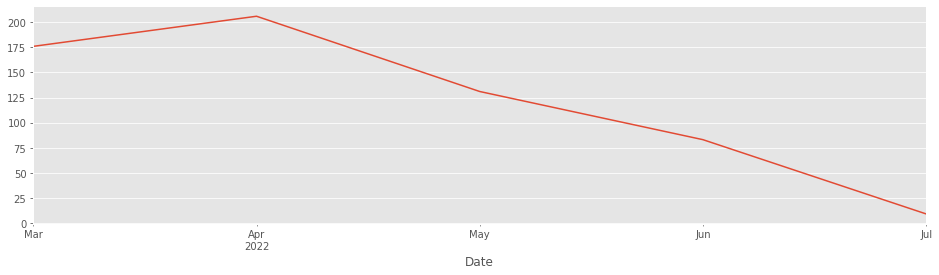

In [199]:
Ru_df['anger'].resample('M').sum().plot(figsize=(16,4))

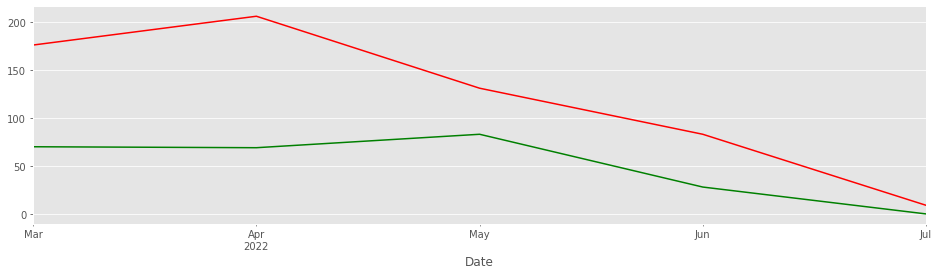

In [200]:
ax = Ru_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Ru_df['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

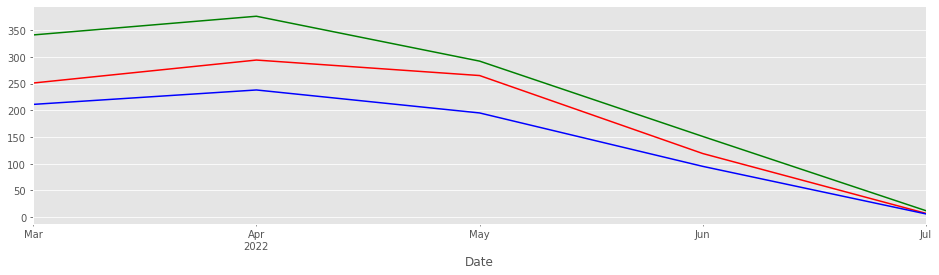

In [201]:
ax = Ru_df['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Ru_df['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
Ru_df['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

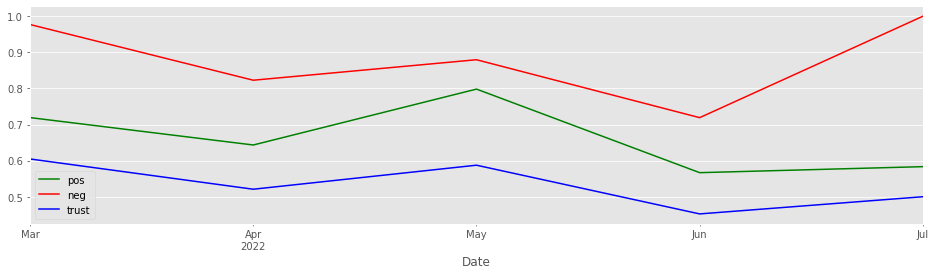

In [202]:
ax = Ru_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
Ru_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
Ru_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

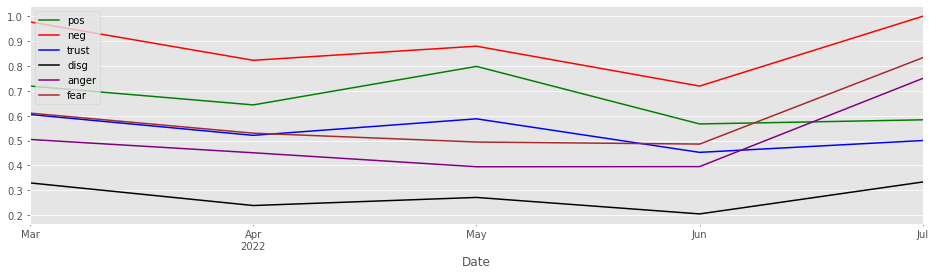

In [203]:
plt.style.use('ggplot')
ax = Ru_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
Ru_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
Ru_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

Ru_df['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

Ru_df['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

Ru_df['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

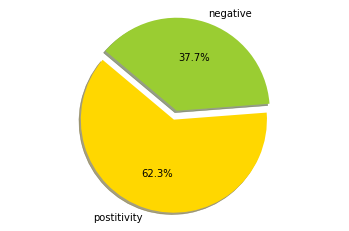

In [204]:
# Data to plot
labels = 'postitivity', 'negative'
sizes = [215, 130]
colors = ['gold', 'yellowgreen']
explode = (0.1, 0,) # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
 autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

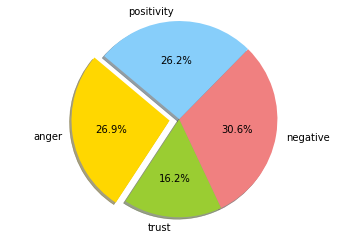

In [205]:
# Data to plot
labels = 'anger', 'trust', 'negative', 'positivity'
sizes = [215, 130, 245, 210]
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0, 0) # explode 1st slice
 
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
 autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.show()

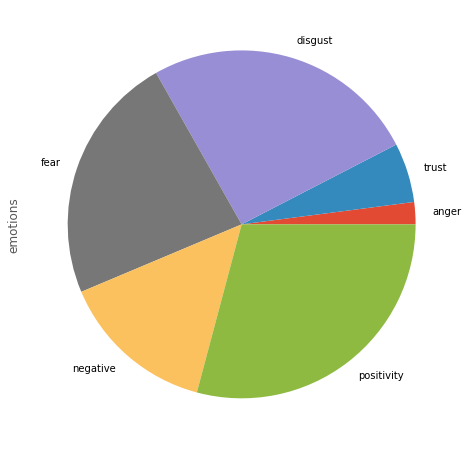

In [206]:
series = pd.Series(3 * np.random.rand(6),
  index =['anger', 'trust', 'disgust', 'fear', 'negative', 'positivity'], name ='emotions')
 
series.plot.pie(figsize =(8, 8))
plt.show()

Text(0, 0.5, 'Years')

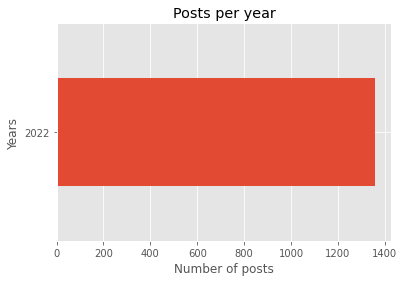

In [207]:
Ru_df['text'].groupby(by=Ru_df.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Hour of the day')

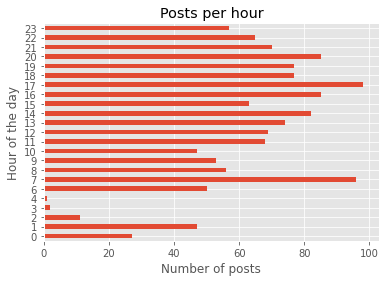

In [208]:
Ru_df['text'].groupby(by=Ru_df.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

Text(0, 0.5, 'Months')

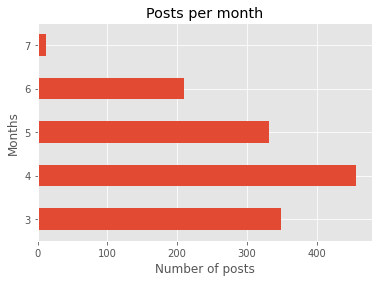

In [209]:
Ru_df['text'].groupby(by=Ru_df.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Months")

In [210]:
Ru_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
Date,,,,,,,,,,,,,,,,,,,,
2022-07-03 13:41:00,0,Ουκρανία: Στα χέρια των ρωσικών δυνάμεων η πόλ...,03 Ιουλίου 2022 13:41,https://www.news247.gr/kosmos/oykrania-sta-che...,"""Έπεσε"" από τις ρωσικές δυνάμεις η πόλη Λισιτσ...",ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,03,13:41,2,0,0,1,1,0,0,2,2,2
2022-07-03 11:39:00,1,"Ρωσία: Συνελήφθη για ""προδοσία"" επιστήμονας το...",03 Ιουλίου 2022 11:39,https://www.news247.gr/kosmos/rosia-synelifthi...,"Ο Ανατόλι Μάσλοφ, επικεφαλής επιστήμονας του ...",ΡΩΣΙΑ,2022,Ιουλίου,03,11:39,2,1,0,1,1,1,1,2,2,2
2022-07-02 20:54:00,2,"Λουκασένκο: ""Η Ουκρανία μας προκαλεί - Προσπάθ...",02 Ιουλίου 2022 20:54,https://www.news247.gr/kosmos/loykasenko-i-oyk...,Ο Λευκορώσος πρόεδρος ισχυρίζεται ότι η Ουκραν...,ΛΕΥΚΟΡΩΣΙΑ,2022,Ιουλίου,02,20:54,1,1,0,0,0,1,0,0,1,0
2022-07-02 19:29:00,3,Ουκρανία: Μάχες στο Λισίτσανσκ - Οι αυτονομιστ...,02 Ιουλίου 2022 19:29,https://www.news247.gr/kosmos/oykrania-maches-...,Το Λισίτσανσκ της ανατολικής Ουκρανίας είναι π...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Ιουλίου,02,19:29,1,0,0,1,0,0,0,0,1,1
2022-07-02 16:36:00,4,Στο λιμάνι του Πειραιά ρυμουλκείται το ρωσικό ...,02 Ιουλίου 2022 16:36,https://www.news247.gr/koinonia/sto-limani-toy...,Με τη βοήθεια δύο ρυμουλκών κατευθύνεται προς ...,ΙΡΑΝ,2022,Ιουλίου,02,16:36,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-17 09:33:00,1355,Στο Στόμα του Λάκη - Podcast: Δυο Πόρσε έχει η...,17 Μαρτίου 2022 09:33,https://www.news247.gr/lakis-lazopoulos/sto-st...,"""Στο Στόμα του Λάκη"" αυτή τη βδομάδα: οι επιτυ...",ΛΑΚΗΣ ΛΑΖΟΠΟΥΛΟΣ PODCAST,2022,Μαρτίου,17,09:33,0,1,0,0,2,0,0,0,0,0
2022-03-17 09:23:00,1356,Ρωσία: Η Οβσιάνικοβα αρνήθηκε την πρόταση να τ...,17 Μαρτίου 2022 09:23,https://www.news247.gr/kosmos/rosia-i-ovsianik...,Η Ρωσίδα δημοσιογράφος που διέκοψε το δελτίο ε...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,09:23,1,3,1,1,0,2,2,2,3,3
2022-03-17 08:05:00,1357,Πόλεμος στην Ουκρανία: Ο Καναδάς απαγορεύει κα...,17 Μαρτίου 2022 08:05,https://www.news247.gr/kosmos/polemos-stin-oyk...,Σταμάτησαν τη μετάδοσή τους στον Καναδά τα ειδ...,ΠΟΛΕΜΟΣ ΣΤΗΝ ΟΥΚΡΑΝΙΑ,2022,Μαρτίου,17,08:05,0,0,0,1,0,0,1,0,1,1


# Rudf - Ukdf

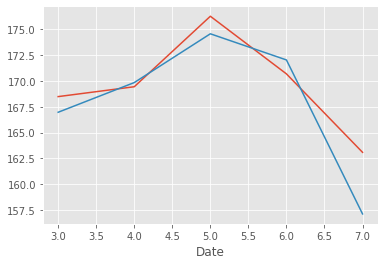

In [211]:
Ru_df['text'].str.len().groupby(by=Ru_df.index.month).mean().plot()
Uk_df['text'].str.len().groupby(by=Uk_df.index.month).mean().plot()

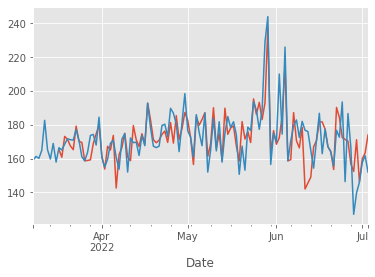

In [212]:
Ru_df['text'].str.len().resample('D').mean().plot() 
Uk_df['text'].str.len().resample('D').mean().plot() 

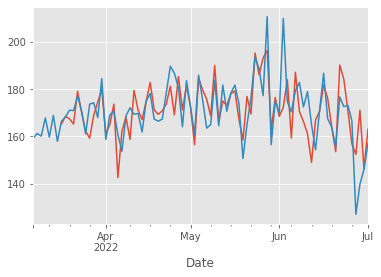

In [213]:
Ru_df['text'].str.len().resample('B').mean().plot() 
Uk_df['text'].str.len().resample('B').mean().plot() 

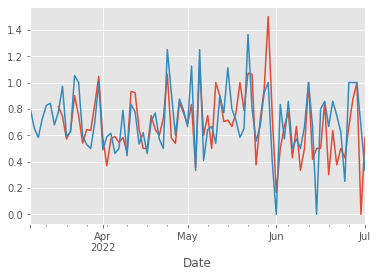

In [214]:
Ru_df['positivity'].resample('B').mean().plot() 
Uk_df['positivity'].resample('B').mean().plot() 

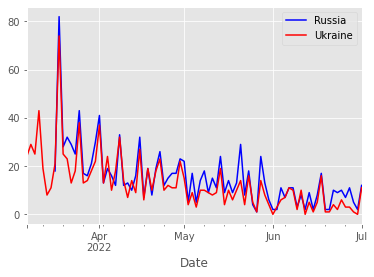

In [215]:
Ru_df['negative'].resample('B').sum().plot(color = 'b',label = 'Russia').legend() 
Uk_df['negative'].resample('B').sum().plot(color = 'r',label = 'Ukraine').legend() 

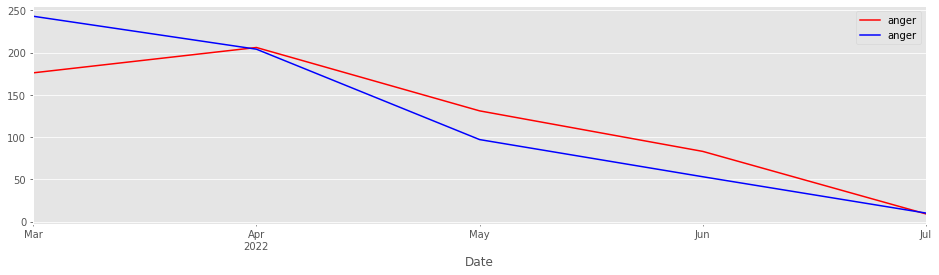

In [216]:
Ru_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red').legend() 
Uk_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'blue').legend()

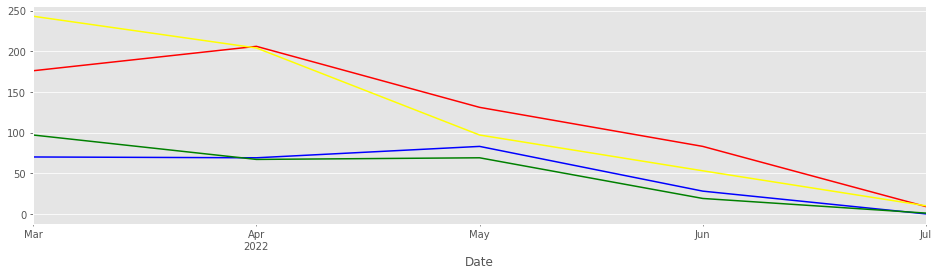

In [217]:
ax = Ru_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Ru_df['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = Uk_df['anger'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
Uk_df['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

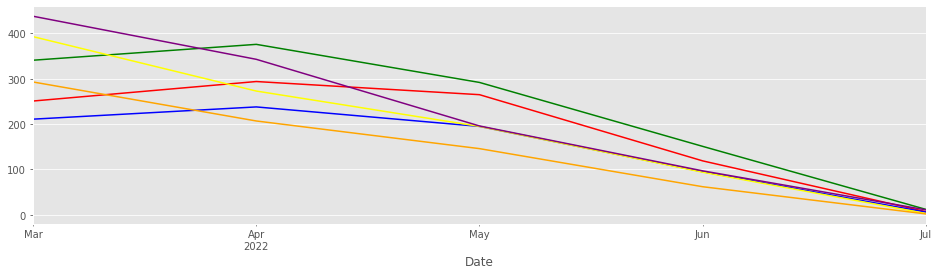

In [218]:
ax = Ru_df['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
Ru_df['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
Ru_df['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = Uk_df['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
Uk_df['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'purple')
Uk_df['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'orange')

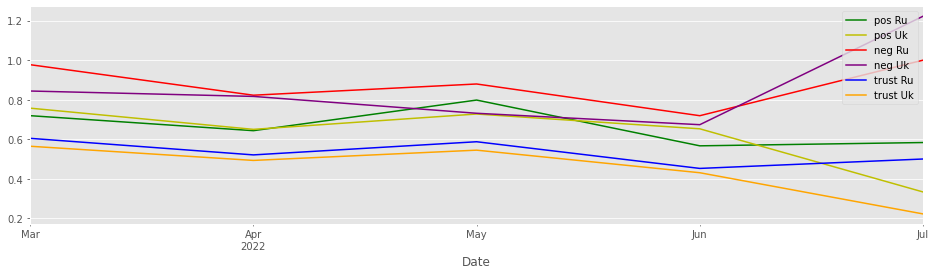

In [219]:
ax = Ru_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
ax = Uk_df['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'y', label='pos Uk')
Ru_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
Uk_df['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'purple')
Ru_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()
Uk_df['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'orange').legend()

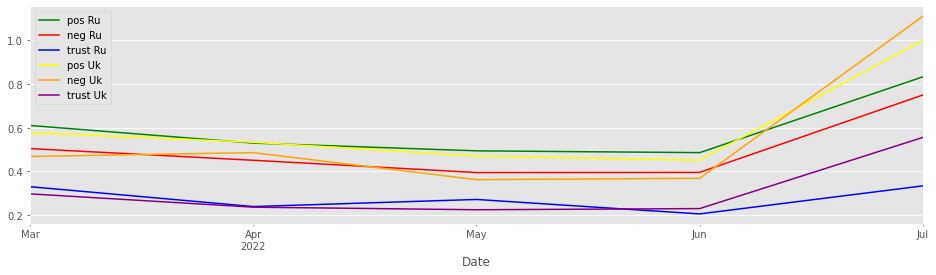

In [220]:
plt.style.use('ggplot')
ax = Ru_df['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
Ru_df['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
Ru_df['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()    
Uk_df['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'yellow', label='pos Uk')
Uk_df['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'orange')
Uk_df['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'purple').legend()                                                